<a href="https://colab.research.google.com/github/grnbatera/TFC/blob/main/TFC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Trabalho Final de Curso - FEEC Unicamp
###Tema: Síntese por Modelagem Física através de Digitais Waveguides.
###Aluno: Gleyson Roberto do Nascimento. RA: 043801.
###Orientador: Prof. Dr. Tiago Fernandes Tavares.
###Férias de Verão 2021.


#Importando arquivos do GitHub



In [449]:
!git clone https://github.com/grnbatera/TFC.git

Cloning into 'TFC'...
remote: Enumerating objects: 109, done.
remote: Counting objects: 100% (109/109), done.
remote: Compressing objects: 100% (108/108), done.
remote: Total 109 (delta 46), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (109/109), 24.36 MiB | 5.53 MiB/s, done.
Resolving deltas: 100% (46/46), done.


#Instalando Tensorflow I/O e Instalando Bibliotecas

In [450]:
#Instalando módulo i/o do tensorflow
!pip install -q tensorflow-io

In [451]:
%matplotlib inline  
import matplotlib.pyplot as plt 
import numpy as np 
from IPython.display import Audio 
import librosa 
import librosa.display 
import librosa.feature
import pandas as pd
import math
import seaborn as sns
import matplotlib as mpl
import tensorflow as tf
import tensorflow_io as tfio
import scipy
from scipy import signal
from decimal import Decimal
from scipy.io.wavfile import write

#Configurando os Gráficos pelo Seaborn

In [452]:
mpl.rcParams['font.family'] = 'Roboto'
plt.rcParams['font.family'] = 'Roboto'
sns.set(font='Roboto',
        rc={
 'axes.axisbelow': False,
 'axes.edgecolor': 'lightgrey',
 'axes.facecolor': 'None',
 'axes.grid': False,
 'axes.labelcolor': 'black',
 'axes.spines.right': False,
 'axes.spines.top': False,
 'figure.facecolor': 'white',
 'lines.solid_capstyle': 'round',
 'patch.edgecolor': 'w',
 'patch.force_edgecolor': True,
 'text.color': 'black',
 'xtick.bottom': False,
 'xtick.color': 'black',
 'xtick.direction': 'out',
 'xtick.top': False,
 'ytick.color': 'black',
 'ytick.direction': 'out',
 'ytick.left': False,
 'ytick.right': False})
 
sns.set_context("notebook", rc={"font.size":20,
                                "axes.titlesize":24,
                                "axes.labelsize":18})
                             

#MIR do Áudio de Controle encontrado no Freesound
https://freesound.org/people/pitx/sounds/18470/

In [453]:
f7='/content/TFC/notaAsusviolao.wav'
y7, fs7=librosa.load(f7, sr=None, mono=True)

In [454]:
Audio(data=y7,rate=fs7)

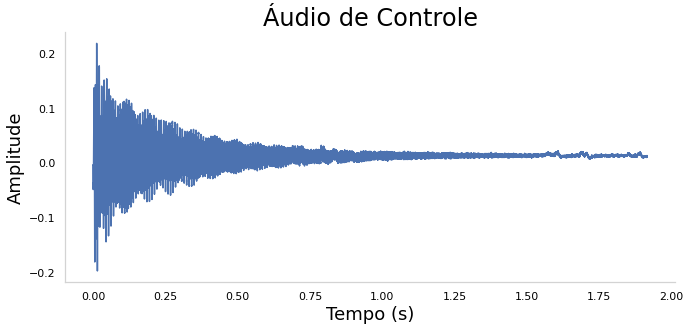

In [455]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y7))/fs7
plt.title('Áudio de Controle')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y7)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/audiodecontrole.svg', format='svg')

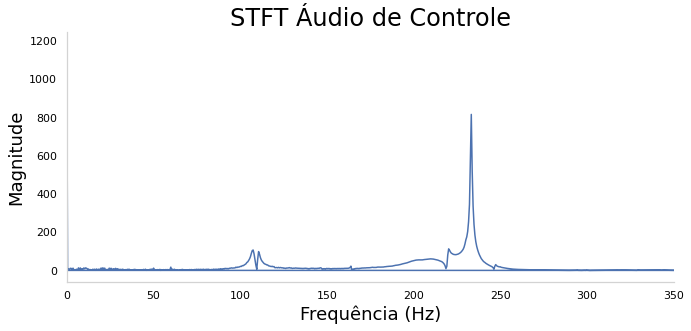

In [456]:
plt.figure(figsize=(10, 5))
Y7 = np.fft.fft(y7) 
freq = np.fft.fftfreq(y7.size, d=1/fs7) 
plt.plot(freq, np.abs(Y7)) 
plt.title('STFT Áudio de Controle') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stftcontrole.svg', format='svg')

In [457]:
D7 = librosa.stft(y7)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


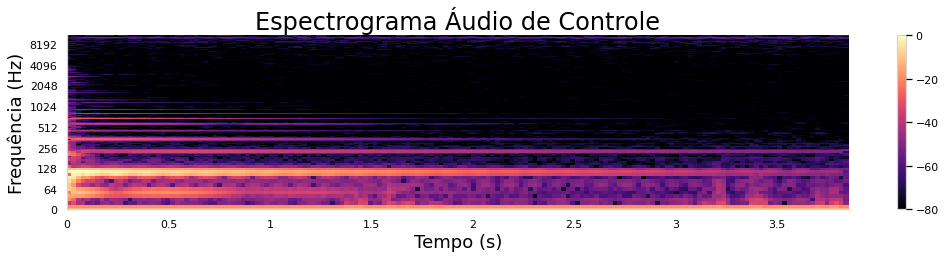

In [458]:
rp7 = np.max(np.abs(D7))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D7, ref=rp7), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Áudio de Controle')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectrocontrole.svg', format='svg')

In [459]:
S7a = np.abs(librosa.stft(y7, n_fft=4096))**2
chroma7 = librosa.feature.chroma_stft(S=S7a, sr=fs7)

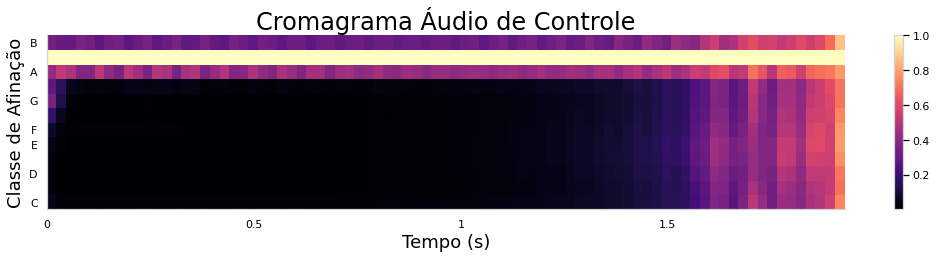

In [460]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma7, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio de Controle')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromacontrole.svg', format='svg')

#Análise do Modelamento Físico com Digital Waveguide

##Waveguide clássica para corda vibrante

###Características Fundamentais:

In [461]:
f=233 #nota desejada
duracao=1.5 #duração da nota desejada
fs=48000 #sample rate(Hz)
Ts=1/fs #período(s)
N=duracao*fs
pu=0.5 #ponto de entrada normalizada na waveguide (0 < pu < 1)
pk=0.9 #ponto de extração normalizada na waveguide (0 < pk < 1)
c=343.2 #velocidade de propagação da onda (m/s)
dist=c*Ts #distância entre os nós
L=0.2*(1/2**((round(12*np.log2(f/440)))/12)) #comprimento da waveguide
Kr=0.99 #constante de reflexão (bridge e nut)

###Sinal de Excitação

In [462]:
intervalo=np.arange(-1,1,Ts) #intervalo do sinal
sinal01=1-abs(intervalo) #Sinal Triangular
sinal02=np.sin(2*np.pi*fs*intervalo) #Sinal Senoidal
sinal01=sinal01-np.mean(sinal01); #Ajuste do sinal pela média.
sinal02=sinal02-np.mean(sinal02); #Ajuste do sinal pela média.

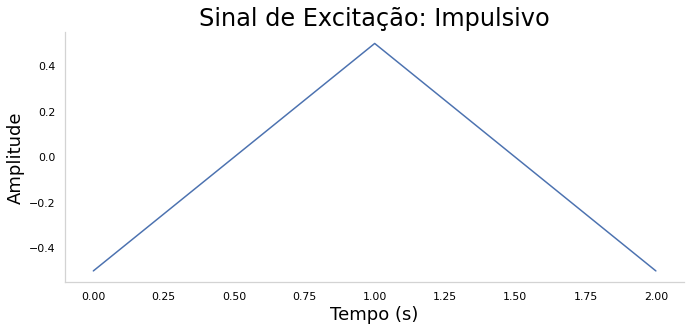

In [463]:
plt.figure(figsize=(10, 5))
t=np.arange(len(sinal01))/fs
plt.title('Sinal de Excitação: Impulsivo')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,sinal01)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/triangular.svg', format='svg')

###Nós na Waveguide, Pontos de Entrada e Saída

In [464]:
nos=round(L/dist) #Número de nós na waveguide
entrada=round(pu*nos) #Ponto de Entrada na waveguide
saida=round(pk*nos) #Ponto de Extração na waveguide

###Filtro digital

In [465]:
r = np.convolve(-1/(Kr+2),[1, Kr, 1])

###Síntese do áudio por waveguide

In [466]:
ydir=np.zeros(nos,)
yesq=np.zeros(nos,)
som_saida=[]
for i in range(round(N)):
  first=0
  last=nos-1
  if i <= len(sinal01):
    ydir[entrada-1]=ydir[entrada-1]+sinal01[i]/2; #caso de superposição
    yesq[entrada-1]=yesq[entrada-1]+sinal01[i]/2; #caso de superposição

  #Wave travel  
  rr1=np.dot(r.reshape(1,len(r)),((ydir[last-3:last]).T.reshape(len(ydir[last-3:last]),1))) 
  rr=rr1.reshape(len(rr1),) #wave travel inferior
  lr=yesq[first]*Kr #wave travel superior

  ydir[1:last]=ydir[first:last-1]
  yesq[first:last-1]=yesq[1:last]
  ydir[first]=-lr
  yesq[last-1]=-rr
  w=ydir[saida-1]+yesq[saida-1]
  som_saida.append(w)  

In [467]:
som_saida=np.asarray(som_saida)

In [468]:
Audio(data=som_saida,rate=fs)

###MIR do áudio sintetizado por waveguide

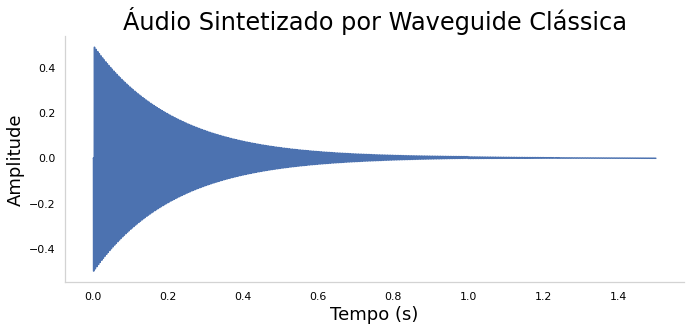

In [469]:
plt.figure(figsize=(10, 5))
t=np.arange(len(som_saida))/fs
plt.title('Áudio Sintetizado por Waveguide Clássica')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,som_saida)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/audioclassico.svg', format='svg')

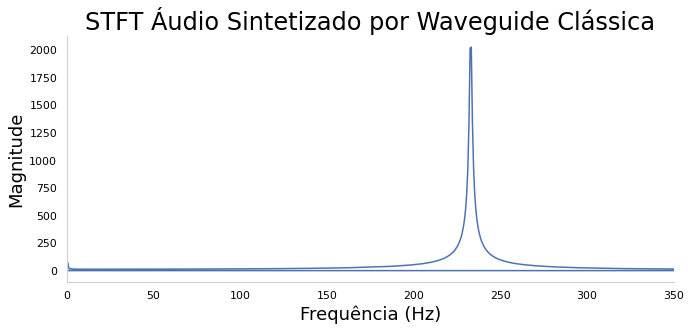

In [470]:
plt.figure(figsize=(10, 5))
Y = np.fft.fft(som_saida) 
freq = np.fft.fftfreq(som_saida.size, d=1/fs) 
plt.plot(freq, np.abs(Y)) 
plt.title('STFT Áudio Sintetizado por Waveguide Clássica') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stftclassico.svg', format='svg')

In [471]:
Dsom_saida = librosa.stft(som_saida)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


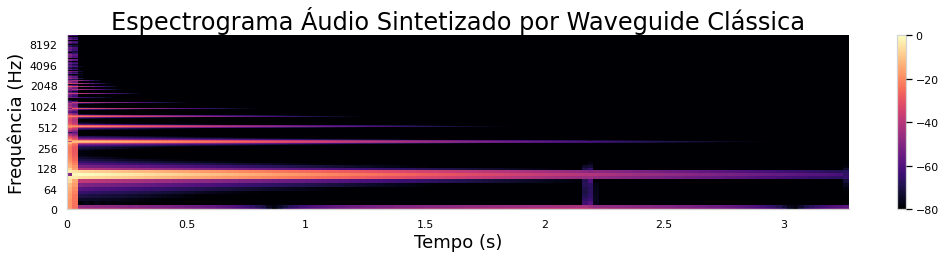

In [472]:
rpsom_saida = np.max(np.abs(Dsom_saida))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(Dsom_saida, ref=rpsom_saida), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Áudio Sintetizado por Waveguide Clássica')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectroclassico.svg', format='svg')

In [473]:
S1a = np.abs(librosa.stft(som_saida, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs)

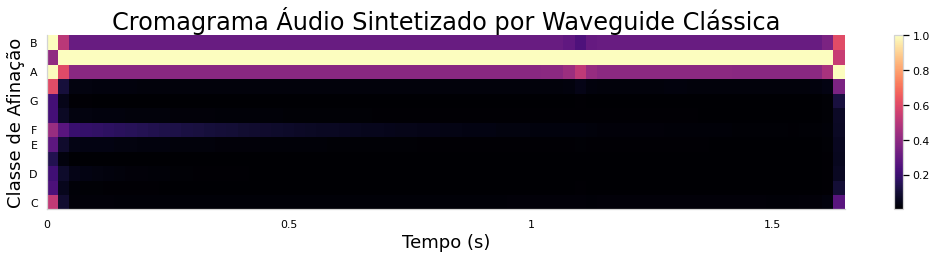

In [474]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio Sintetizado por Waveguide Clássica')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromaclassico.svg', format='svg')

###Formalização do sintetizador por Waveguide Clássica

In [475]:
def waveguide(f,duracao,fs,excitacao,pu,pk,Kr,ganho):
  '''
  Onde:
  f = frequência da nota desejada
  duracao = duração da nota desejada
  fs = sample rate
  excitacao = sinal que inicia a waveguide
  pu = ponto de entrada normalizado na waveguide 0 < pu < 1
  pk = ponto de extração normalizado na waveguide 0 < pk < 1
  Kr = coeficiente de reflexão entre as ondas superior e inferior da Waveguide
  ganho = ganho para adequação entre o áudio sintetizado e o de controle
  '''
  if ganho==0:
    ganho = 1
  Ts=1/fs #período(s)
  N=duracao*fs
  c=343.2 #velocidade do som no ar (m/s)
  dist=c*Ts #distância entre os nós
  L=0.2*(1/2**((round(12*np.log2(f/440)))/12)) #comprimento da waveguide
  nos=round(L/dist) #Número de nós na waveguide
  entrada=round(pu*nos) #Ponto de Entrada na waveguide
  saida=round(pk*nos) #Ponto de Extração na waveguide
  r = np.convolve(-1/(Kr+2),[1, Kr, 1])
  ydir=np.zeros(nos,)
  yesq=np.zeros(nos,)
  som_saida=[]
  for i in range(round(N)):
    first=0
    last=nos-1
    if i <= len(excitacao):
      ydir[entrada-1]=ydir[entrada-1]+excitacao[i]/2; #caso de superposição
      yesq[entrada-1]=yesq[entrada-1]+excitacao[i]/2; #caso de superposição
    
    #Wave travel
    rr1=np.dot(r.reshape(1,len(r)),((ydir[last-3:last]).T.reshape(len(ydir[last-3:last]),1)))
    rr=rr1.reshape(len(rr1),) #wave travel inferior
    lr=yesq[first]*Kr #wave travel superior

    ydir[1:last]=ydir[first:last-1]
    yesq[first:last-1]=yesq[1:last]
    ydir[first]=-lr
    yesq[last-1]=-rr
    w=ydir[saida-1]+yesq[saida-1]
    som_saida.append(w)
  return ganho*np.array(som_saida)


##Diferentes Sinais de excitação na Waveguide Clássica

In [476]:
ganho=1/3

In [477]:
triangular = waveguide(f,duracao,fs,sinal01,pu,pk,Kr,ganho)

In [478]:
Audio(data=triangular,rate=fs)

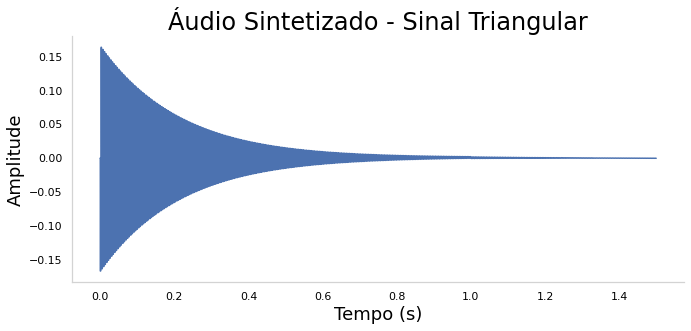

In [479]:
plt.figure(figsize=(10, 5))
t=np.arange(len(triangular))/fs
plt.title('Áudio Sintetizado - Sinal Triangular')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,triangular)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/triangular.svg', format='svg')

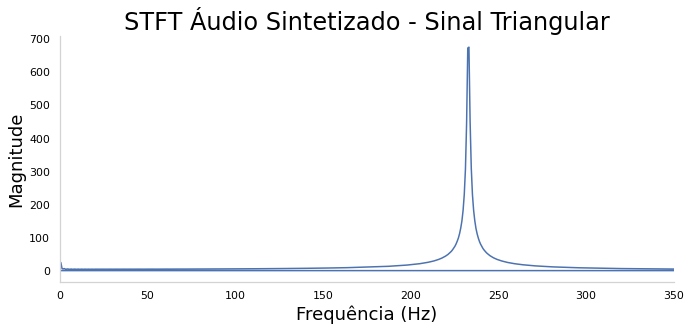

In [480]:
plt.figure(figsize=(10, 5))
Yt = np.fft.fft(triangular) 
freq = np.fft.fftfreq(triangular.size, d=1/fs) 
plt.plot(freq, np.abs(Yt)) 
plt.title('STFT Áudio Sintetizado - Sinal Triangular') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfttriangular.svg', format='svg')

In [481]:
Dt = librosa.stft(triangular)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


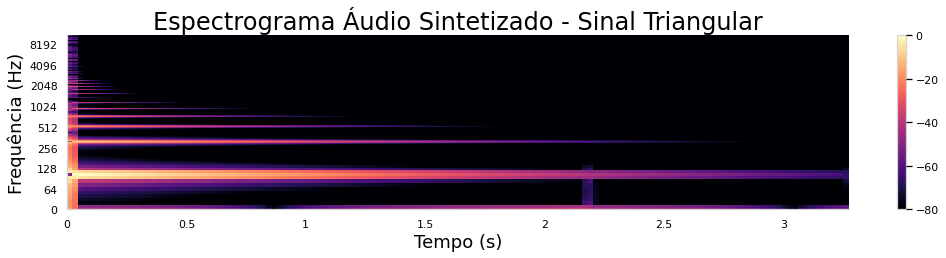

In [482]:
rpt = np.max(np.abs(Dt))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(Dt, ref=rpt), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Áudio Sintetizado - Sinal Triangular')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectrotriangular.svg', format='svg')

In [483]:
Sta = np.abs(librosa.stft(triangular, n_fft=4096))**2
chromat = librosa.feature.chroma_stft(S=Sta, sr=fs)

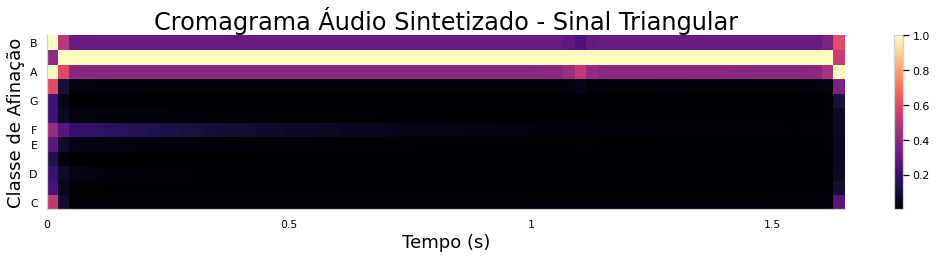

In [484]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chromat, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio Sintetizado - Sinal Triangular')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromatriangular.svg', format='svg')

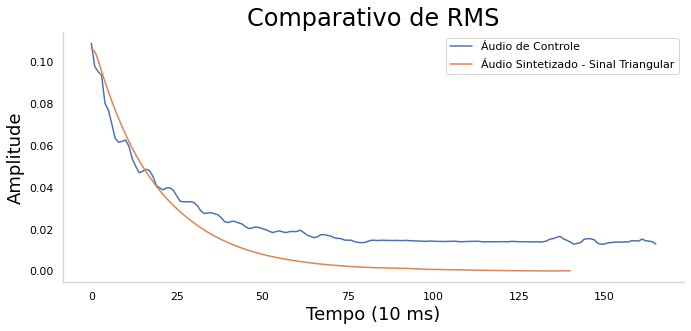

In [485]:
rms7=librosa.feature.rms(y=y7)
rmst=librosa.feature.rms(y=triangular)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rmst.T, label="Áudio Sintetizado - Sinal Triangular")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmstriang01.svg', format='svg')

In [486]:
senoidal = (10**6)*waveguide(f,duracao,fs,sinal02,pu,pk,Kr,ganho)

In [487]:
Audio(data=senoidal,rate=fs)

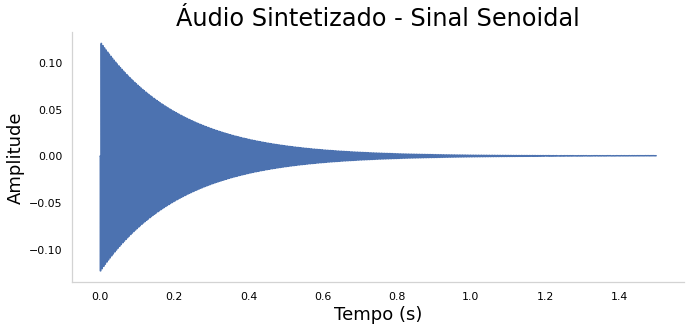

In [488]:
plt.figure(figsize=(10, 5))
t=np.arange(len(senoidal))/fs
plt.title('Áudio Sintetizado - Sinal Senoidal')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,senoidal)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/senoidal.svg', format='svg')

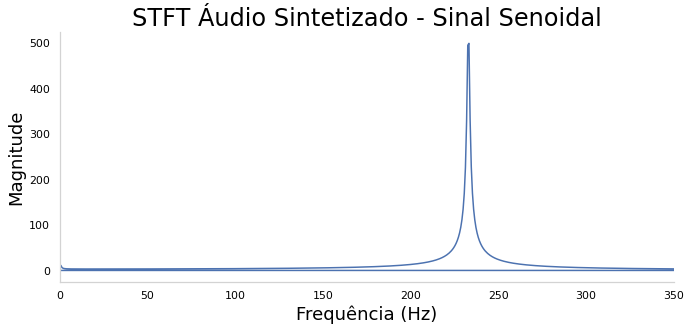

In [489]:
plt.figure(figsize=(10, 5))
Ys = np.fft.fft(senoidal) 
freq = np.fft.fftfreq(senoidal.size, d=1/fs) 
plt.plot(freq, np.abs(Ys)) 
plt.title('STFT Áudio Sintetizado - Sinal Senoidal') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stftsenoidal.svg', format='svg')

In [490]:
Ds = librosa.stft(senoidal)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


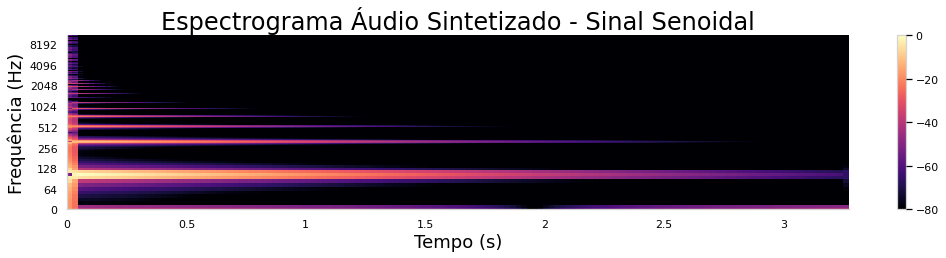

In [491]:
rps = np.max(np.abs(Ds))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(Ds, ref=rps), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Áudio Sintetizado - Sinal Senoidal')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectrosenoidal.svg', format='svg')

In [492]:
Ssa = np.abs(librosa.stft(senoidal, n_fft=4096))**2
chromas = librosa.feature.chroma_stft(S=Ssa, sr=fs)

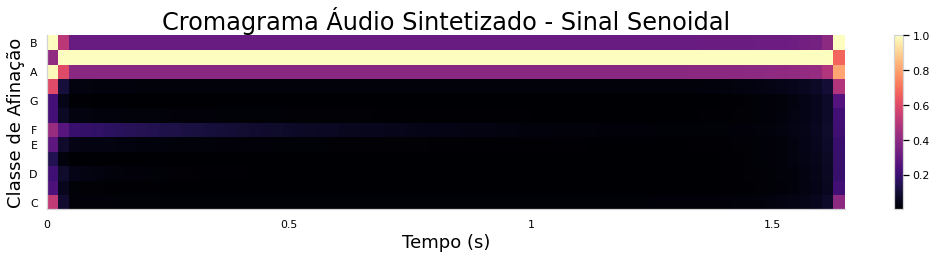

In [493]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chromas, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio Sintetizado - Sinal Senoidal')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromasenoidal.svg', format='svg')

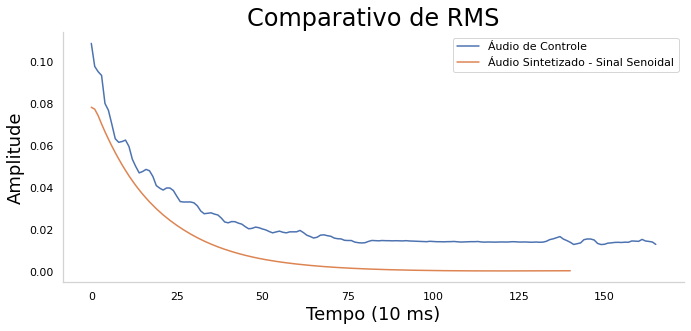

In [494]:
rms7=librosa.feature.rms(y=y7)
rmss=librosa.feature.rms(y=senoidal)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rmss.T, label="Áudio Sintetizado - Sinal Senoidal")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmssenoidal01.svg', format='svg')

In [495]:
sinal03=scipy.signal.unit_impulse(len(triangular)) #Resposta ao Impulso

In [496]:
impulsivo = 4*waveguide(f,duracao,fs,sinal03,pu,pk,Kr,ganho)

In [497]:
Audio(data=impulsivo,rate=fs)

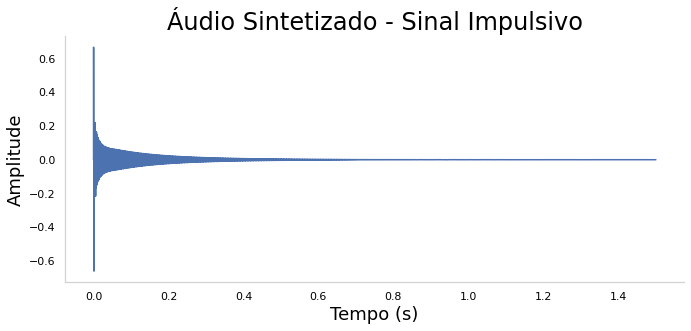

In [498]:
plt.figure(figsize=(10, 5))
t=np.arange(len(impulsivo))/fs
plt.title('Áudio Sintetizado - Sinal Impulsivo')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,impulsivo)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/impulsivo.svg', format='svg')

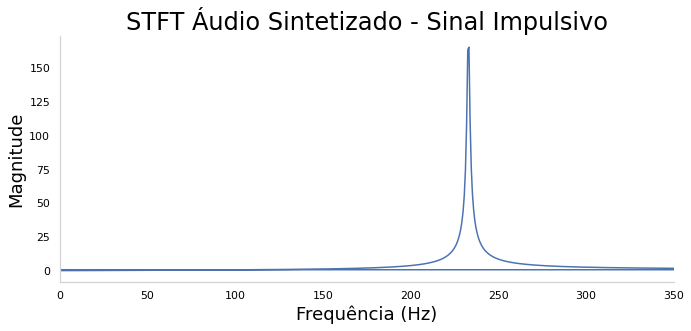

In [499]:
plt.figure(figsize=(10, 5))
Yi = np.fft.fft(impulsivo) 
freq = np.fft.fftfreq(impulsivo.size, d=1/fs) 
plt.plot(freq, np.abs(Yi)) 
plt.title('STFT Áudio Sintetizado - Sinal Impulsivo') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stftimpulsivo.svg', format='svg')

In [500]:
Di = librosa.stft(impulsivo)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


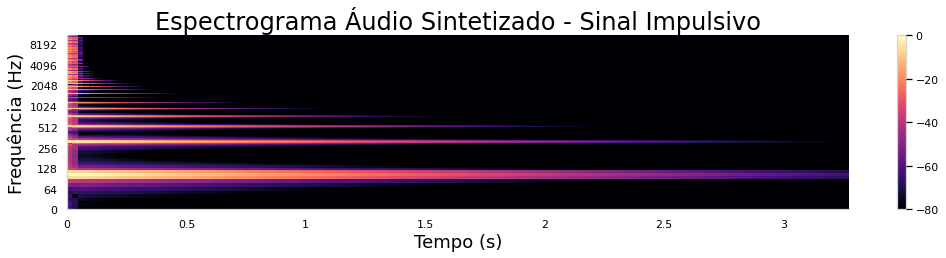

In [501]:
rpi = np.max(np.abs(Di))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(Di, ref=rpi), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Áudio Sintetizado - Sinal Impulsivo')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectroimpulsivo.svg', format='svg')

In [502]:
Sia = np.abs(librosa.stft(impulsivo, n_fft=4096))**2
chromai = librosa.feature.chroma_stft(S=Sia, sr=fs)

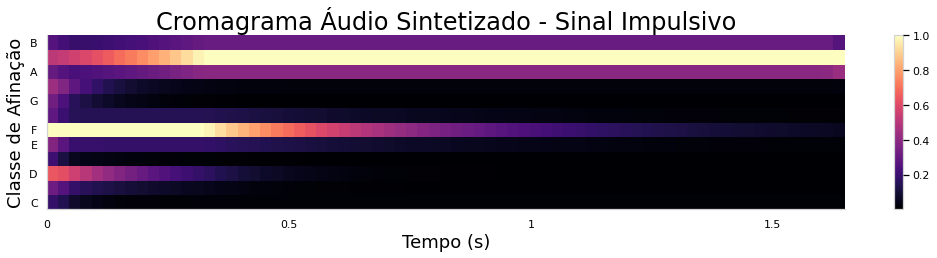

In [503]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chromai, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio Sintetizado - Sinal Impulsivo')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromaimpulsivo.svg', format='svg')

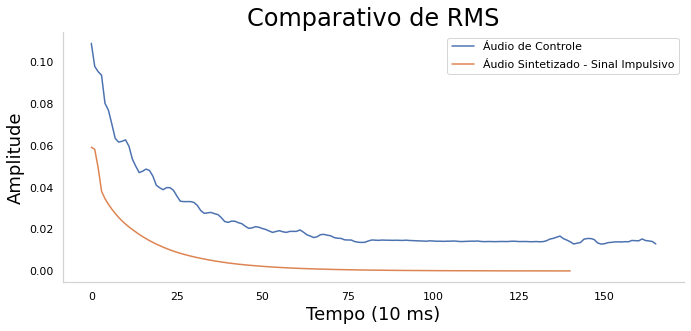

In [504]:
rms7=librosa.feature.rms(y=y7)
rmsi=librosa.feature.rms(y=impulsivo)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rmsi.T, label="Áudio Sintetizado - Sinal Impulsivo")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmsimpulsivo01.svg', format='svg')

##Efeito de corpo na waveguide clássica: Áudio pela convolução do sinal sintetizado com a RI de corpo

###Sinais de Impulso e Resposta de Corpo ao Impulso

In [505]:
fs0=48000

In [506]:
y0=scipy.signal.unit_impulse(fs0)

In [507]:
Audio(data=y0,rate=fs0)

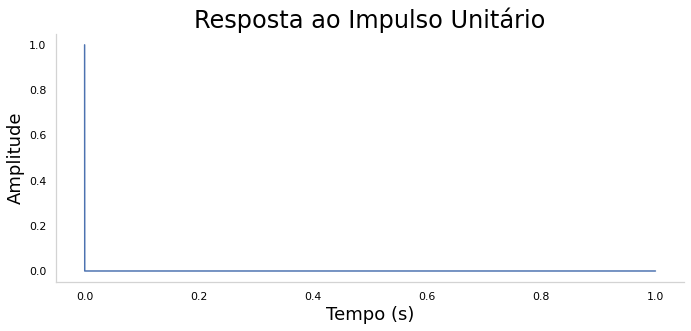

In [508]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y0))/fs0
plt.title('Resposta ao Impulso Unitário')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y0)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y0.svg', format='svg')

In [509]:
f1='/content/TFC/IR02/Classical-AmBu2F.wav'
y1, fs1=librosa.load(f1, sr=None, mono=True)

In [510]:
Audio(data=y1,rate=fs1)

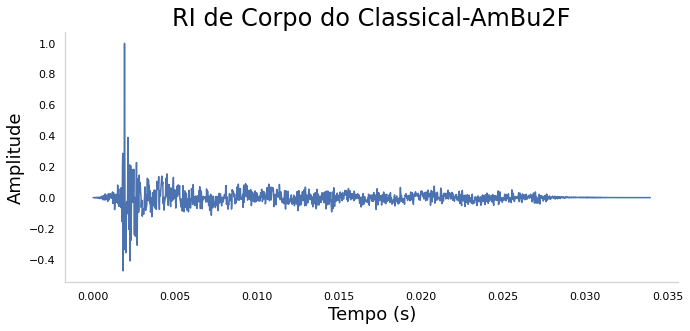

In [511]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y1))/fs1
plt.title('RI de Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y1)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y1.svg', format='svg')

In [512]:
f2='/content/TFC/IR02/Collings-D2H.wav'
y2, fs2=librosa.load(f2, sr=None, mono=True)

In [513]:
Audio(data=y2,rate=fs2)

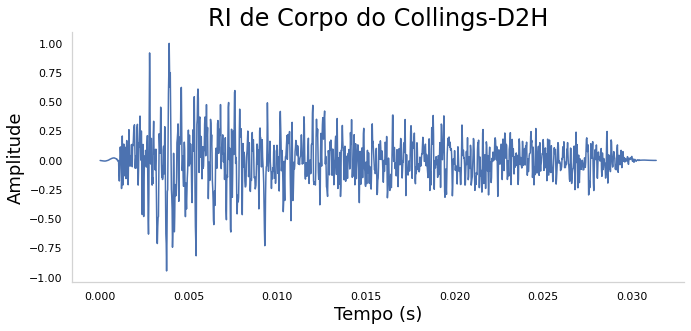

In [514]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y2))/fs2
plt.title('RI de Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y2)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y2.svg', format='svg')

In [515]:
f3='/content/TFC/IR02/Gibson-J45.wav'
y3, fs3=librosa.load(f3, sr=None, mono=True)

In [516]:
Audio(data=y3,rate=fs3)

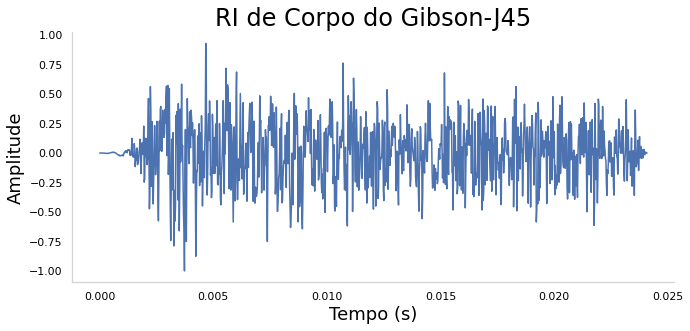

In [517]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y3))/fs3
plt.title('RI de Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y3)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y3.svg', format='svg')

In [518]:
f4='/content/TFC/IR02/Hummingbird-Classic.wav'
y4, fs4=librosa.load(f4, sr=None, mono=True)

In [519]:
Audio(data=y4,rate=fs4)

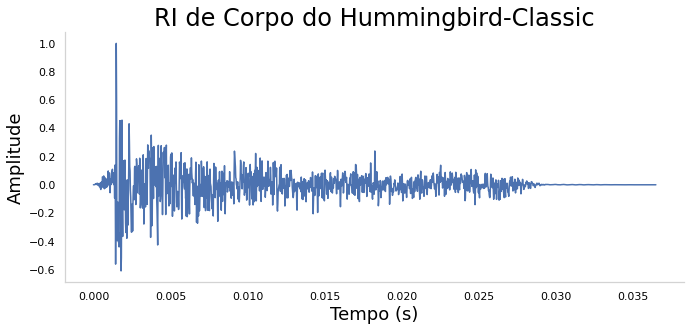

In [520]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y4))/fs4
plt.title('RI de Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y4)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y4.svg', format='svg')

In [521]:
f5='/content/TFC/IR02/Martin-HD28.wav'
y5, fs5=librosa.load(f5, sr=None, mono=True)

In [522]:
Audio(data=y5,rate=fs5)

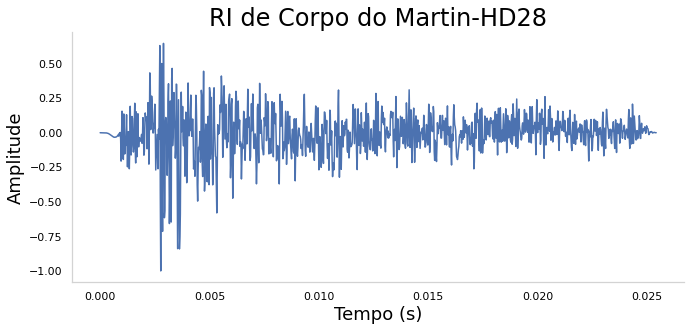

In [523]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y5))/fs5
plt.title('RI de Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y5)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y5.svg', format='svg')

In [524]:
f6='/content/TFC/IR02/Taylor-814.wav'
y6, fs6=librosa.load(f6, sr=None, mono=True)

In [525]:
Audio(data=y6,rate=fs6)

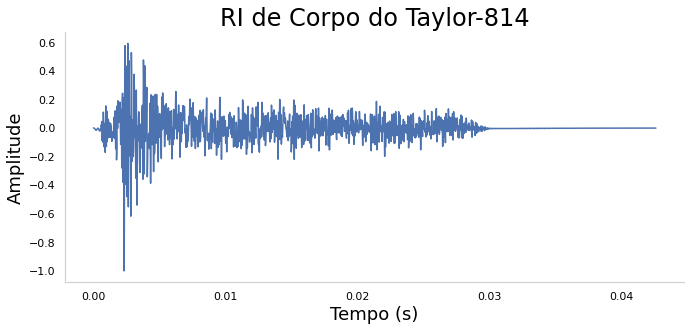

In [526]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y6))/fs6
plt.title('RI de Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y6)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/y6.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Classical-AmBu2F

In [527]:
ganhoc=1/60

In [528]:
s1a = ganhoc*(scipy.signal.oaconvolve(waveguide(f,duracao,fs1,sinal01,pu,pk,Kr,1),y1))
s1a=s1a/(max(abs(s1a))+.1)

In [529]:
Audio(data=s1a,rate=fs1)

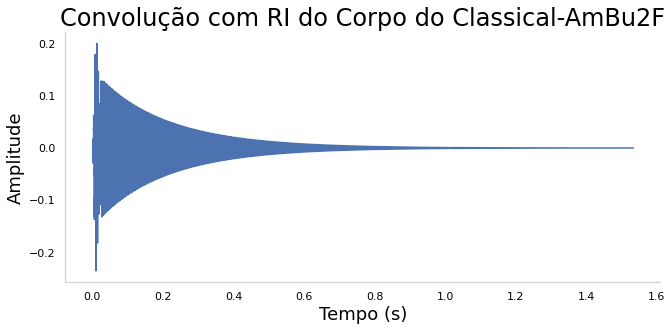

In [530]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s1a))/fs1
plt.title('Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s1a)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/s1a.svg', format='svg')

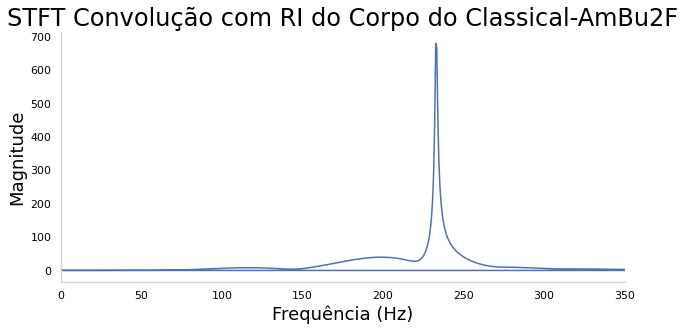

In [531]:
plt.figure(figsize=(10, 5))
Y1 = np.fft.fft(s1a) 
freq = np.fft.fftfreq(s1a.size, d=1/fs1) 
plt.plot(freq, np.abs(Y1)) 
plt.title('STFT Convolução com RI do Corpo do Classical-AmBu2F') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfts1a.svg', format='svg')

In [532]:
D1 = librosa.stft(s1a)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


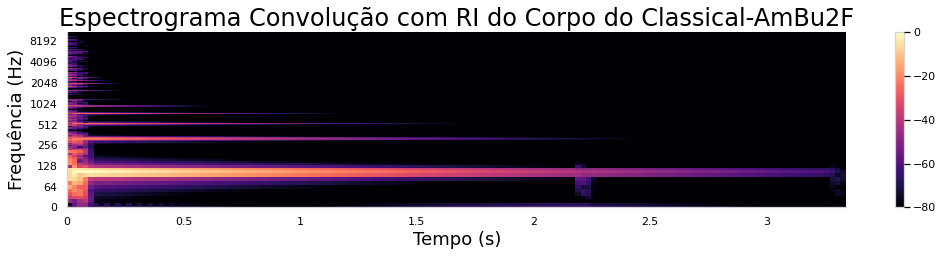

In [533]:
rp1 = np.max(np.abs(D1))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D1, ref=rp1), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectros1a.svg', format='svg')

In [534]:
S1a = np.abs(librosa.stft(s1a, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs1)

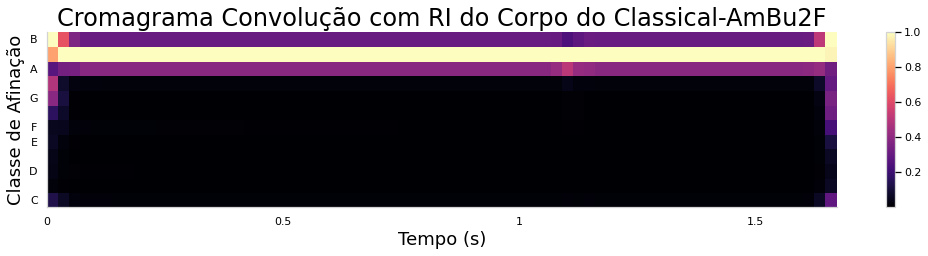

In [535]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromas1a.svg', format='svg')

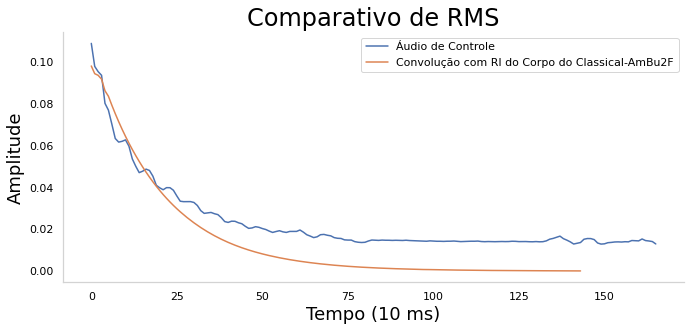

In [536]:
rms7=librosa.feature.rms(y=y7)
rms1a=librosa.feature.rms(y=s1a)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms1a.T, label="Convolução com RI do Corpo do Classical-AmBu2F")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss1a.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Collings-D2H

In [537]:
s2a= ganhoc*(scipy.signal.oaconvolve(waveguide(f,duracao,fs2,sinal01,pu,pk,Kr,1),y2))
s2a=s2a/(max(abs(s2a))+.1)

In [538]:
Audio(data=s2a,rate=fs2)

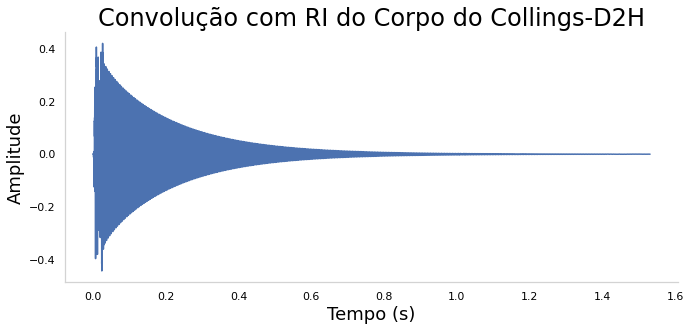

In [539]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s2a))/fs2
plt.title('Convolução com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s2a)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/s2a.svg', format='svg')

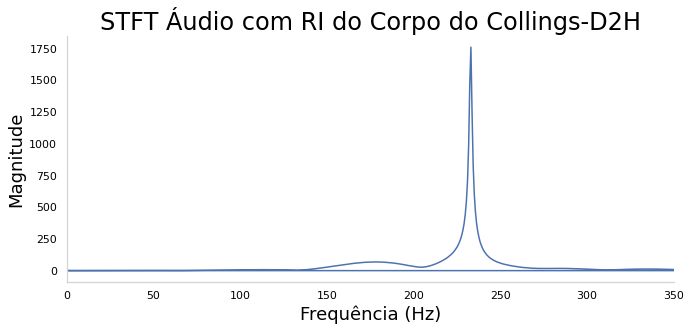

In [540]:
plt.figure(figsize=(10, 5))
Y2 = np.fft.fft(s2a) 
freq = np.fft.fftfreq(s2a.size, d=1/fs2) 
plt.plot(freq, np.abs(Y2)) 
plt.title('STFT Áudio com RI do Corpo do Collings-D2H') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfts2a.svg', format='svg')

In [541]:
D2 = librosa.stft(s2a)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


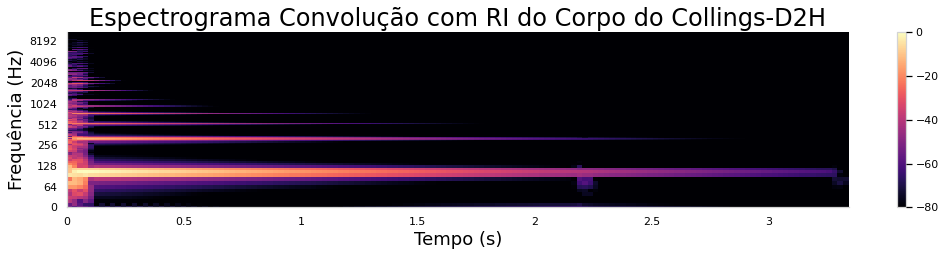

In [542]:
rp2 = np.max(np.abs(D2))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D2, ref=rp2), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectros2a.svg', format='svg')

In [543]:
S2a = np.abs(librosa.stft(s2a, n_fft=4096))**2
chroma2 = librosa.feature.chroma_stft(S=S2a, sr=fs2)

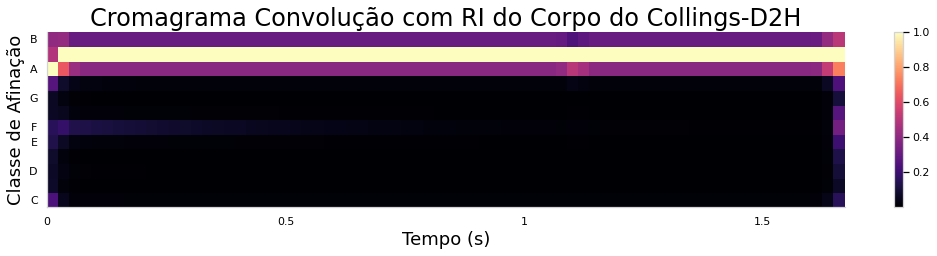

In [544]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma2, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromas2a.svg', format='svg')

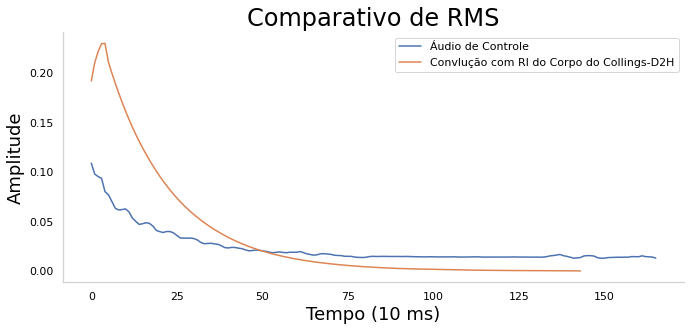

In [545]:
rms7=librosa.feature.rms(y=y7)
rms2a=librosa.feature.rms(y=s2a)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms2a.T, label="Convlução com RI do Corpo do Collings-D2H")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss2a.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Gibson-J45

In [546]:
s3a = ganhoc*(scipy.signal.oaconvolve(waveguide(f,duracao,fs3,sinal01,pu,pk,Kr,1),y3))
s3a=s3a/(max(abs(s3a))+.1)

In [547]:
Audio(data=s3a,rate=fs3)

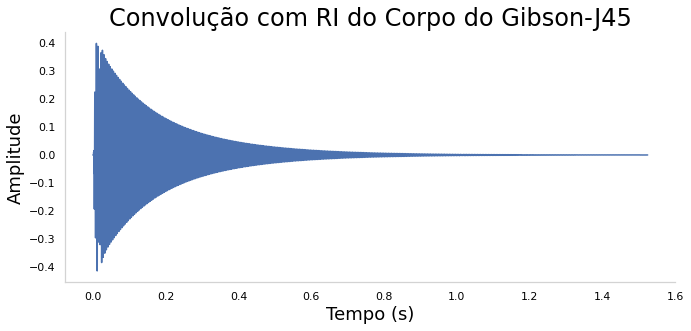

In [548]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s3a))/fs3
plt.title('Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s3a)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/s3a.svg', format='svg')

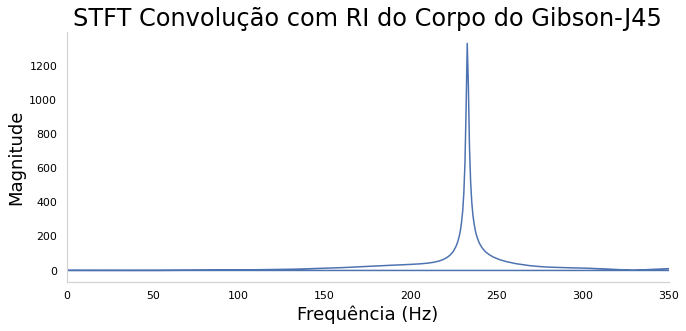

In [549]:
plt.figure(figsize=(10, 5))
Y3 = np.fft.fft(s3a) 
freq = np.fft.fftfreq(s3a.size, d=1/fs3) 
plt.plot(freq, np.abs(Y3)) 
plt.title('STFT Convolução com RI do Corpo do Gibson-J45') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfts3a.svg', format='svg')

In [550]:
D3 = librosa.stft(s3a)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


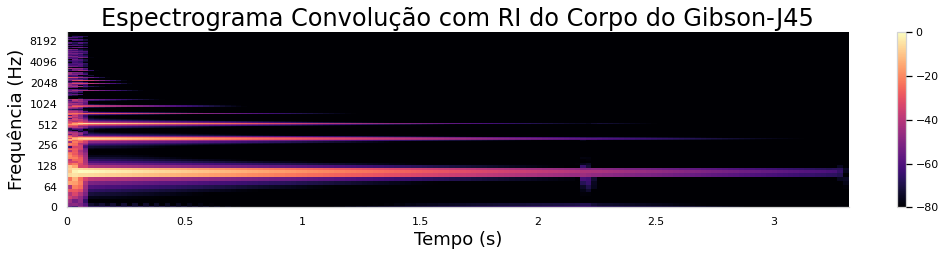

In [551]:
rp3 = np.max(np.abs(D3))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D3, ref=rp3), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectros3a.svg', format='svg')

In [552]:
S3a = np.abs(librosa.stft(s3a, n_fft=4096))**2
chroma3 = librosa.feature.chroma_stft(S=S3a, sr=fs3)

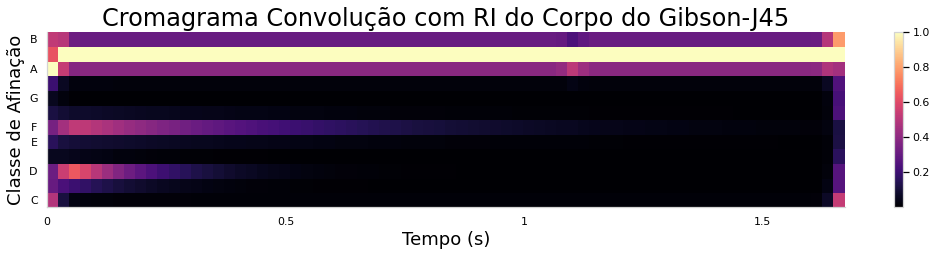

In [553]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma3, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromas3a.svg', format='svg')

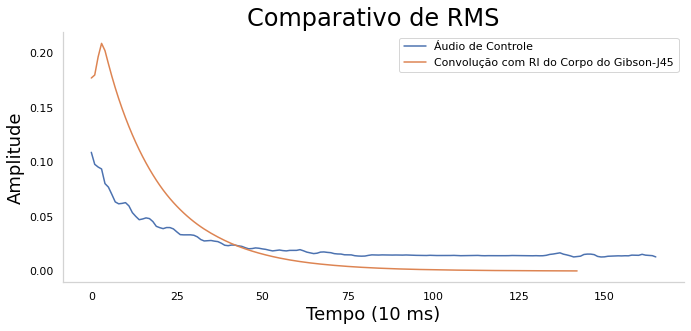

In [554]:
rms7=librosa.feature.rms(y=y7)
rms3a=librosa.feature.rms(y=s3a)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms3a.T, label="Convolução com RI do Corpo do Gibson-J45")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss3a.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Hummingbird-Classic

In [555]:
s4a = ganhoc*(scipy.signal.oaconvolve(waveguide(f,duracao,fs4,sinal01,pu,pk,Kr,1),y4))
s4a=s4a/(max(abs(s4a))+.1)

In [556]:
Audio(data=s4a,rate=fs4)

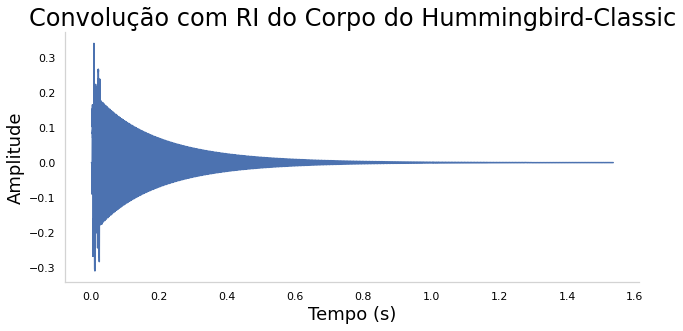

In [557]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s4a))/fs4
plt.title('Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s4a)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/s4a.svg', format='svg')

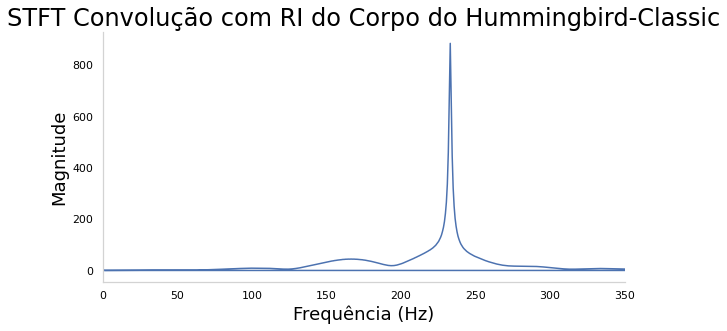

In [558]:
plt.figure(figsize=(10, 5))
Y4 = np.fft.fft(s4a) 
freq = np.fft.fftfreq(s4a.size, d=1/fs4) 
plt.plot(freq, np.abs(Y4)) 
plt.title('STFT Convolução com RI do Corpo do Hummingbird-Classic') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfts4a.svg', format='svg')

In [559]:
D4 = librosa.stft(s4a)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


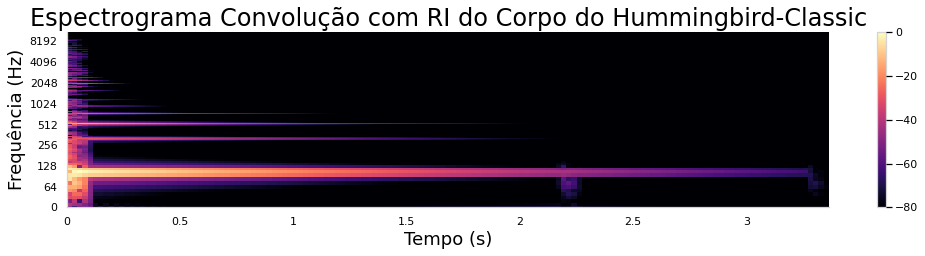

In [560]:
rp4 = np.max(np.abs(D4))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D4, ref=rp4), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectros4a.svg', format='svg')

In [561]:
S4a = np.abs(librosa.stft(s4a, n_fft=4096))**2
chroma4 = librosa.feature.chroma_stft(S=S4a, sr=fs4)

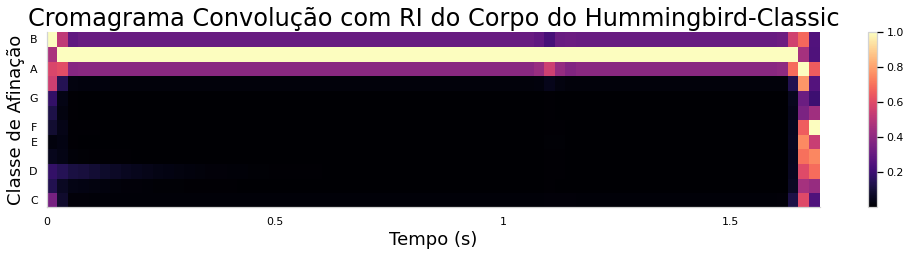

In [562]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma4, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromas4a.svg', format='svg')

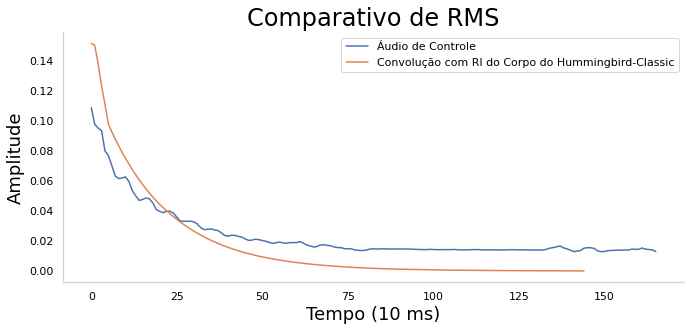

In [563]:
rms7=librosa.feature.rms(y=y7)
rms4a=librosa.feature.rms(y=s4a)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms4a.T, label="Convolução com RI do Corpo do Hummingbird-Classic")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss4a.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Martin-HD28

In [564]:
s5a = ganhoc*(scipy.signal.oaconvolve(waveguide(f,duracao,fs5,sinal01,pu,pk,Kr,1),y5))
s5a=s5a/(max(abs(s5a))+.1)

In [565]:
Audio(data=s5a,rate=fs5)

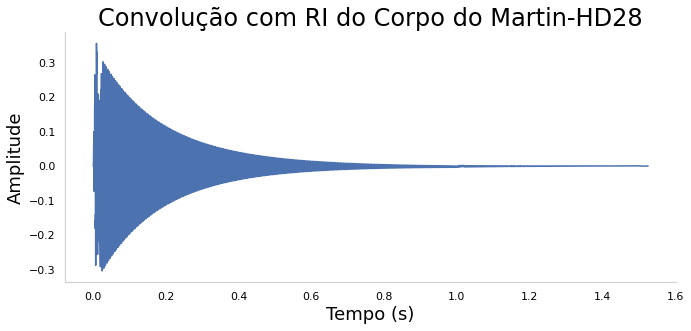

In [566]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s5a))/fs5
plt.title('Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s5a)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/s5a.svg', format='svg')

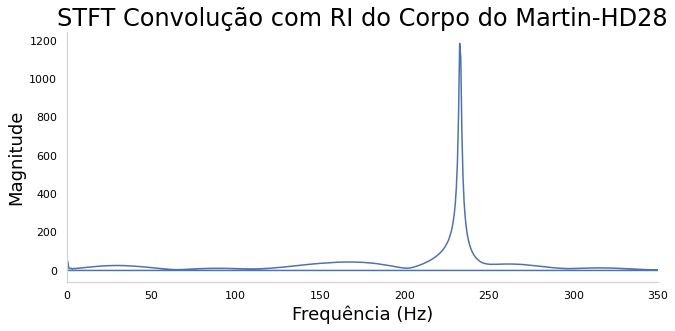

In [567]:
plt.figure(figsize=(10, 5))
Y5 = np.fft.fft(s5a) 
freq = np.fft.fftfreq(s5a.size, d=1/fs5) 
plt.plot(freq, np.abs(Y5)) 
plt.title('STFT Convolução com RI do Corpo do Martin-HD28') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfts5a.svg', format='svg')

In [568]:
D5 = librosa.stft(s5a)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


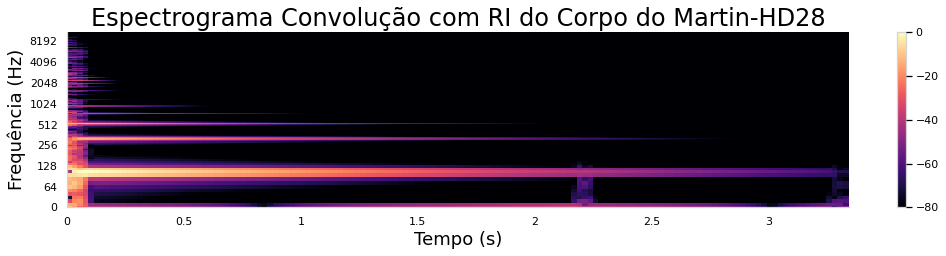

In [569]:
rp5 = np.max(np.abs(D5))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D5, ref=rp5), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectros5a.svg', format='svg')

In [570]:
S5a = np.abs(librosa.stft(s5a, n_fft=4096))**2
chroma5 = librosa.feature.chroma_stft(S=S5a, sr=fs5)

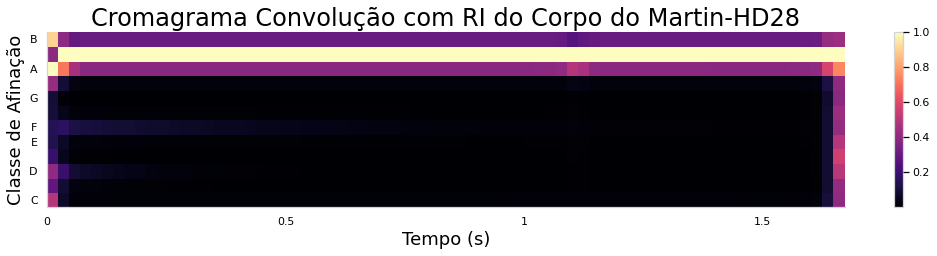

In [571]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma5, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromas5a.svg', format='svg')

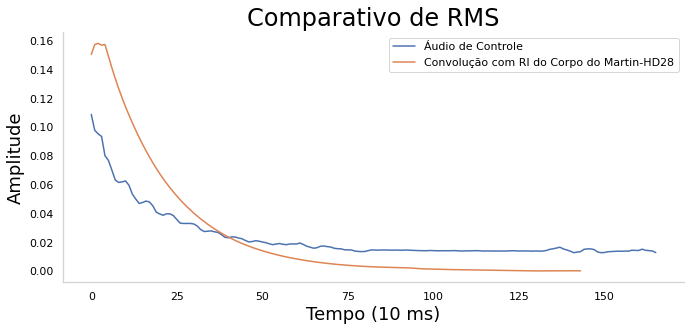

In [572]:
rms7=librosa.feature.rms(y=y7)
rms5a=librosa.feature.rms(y=s5a)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms5a.T, label="Convolução com RI do Corpo do Martin-HD28")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss5a.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Taylor-814

In [573]:
s6a = ganhoc*(scipy.signal.oaconvolve(waveguide(f,duracao,fs6,sinal01,pu,pk,Kr,1),y6))
s6a=s6a/(max(abs(s6a))+.1)

In [574]:
Audio(data=s6a,rate=fs6)

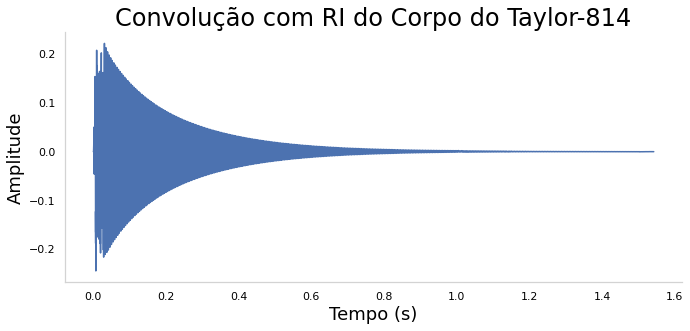

In [575]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s6a))/fs6
plt.title('Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s6a)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/s6a.svg', format='svg')

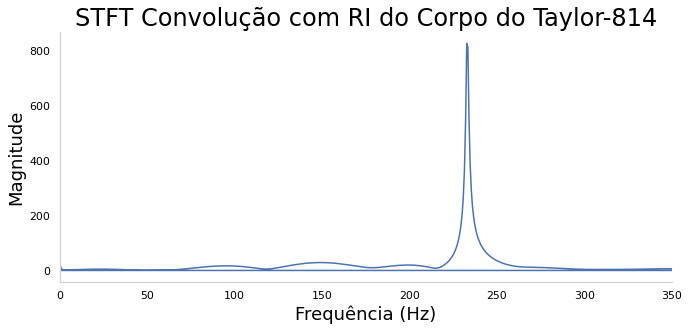

In [576]:
plt.figure(figsize=(10, 5))
Y6 = np.fft.fft(s6a) 
freq = np.fft.fftfreq(s6a.size, d=1/fs6) 
plt.plot(freq, np.abs(Y6)) 
plt.title('STFT Convolução com RI do Corpo do Taylor-814') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stfts6a.svg', format='svg')

In [577]:
D6 = librosa.stft(s6a)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


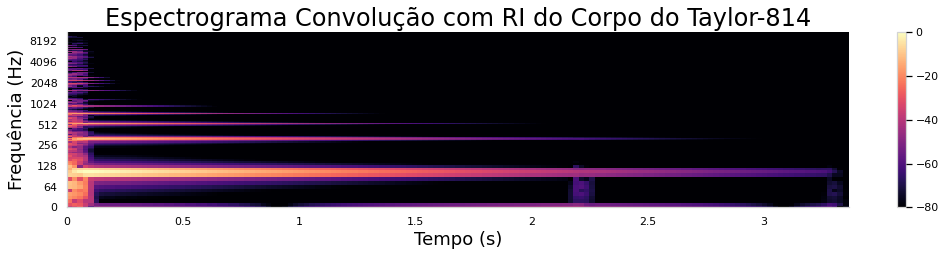

In [578]:
rp6 = np.max(np.abs(D6))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D6, ref=rp6), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectros6a.svg', format='svg')

In [579]:
S6a = np.abs(librosa.stft(s6a, n_fft=4096))**2
chroma6 = librosa.feature.chroma_stft(S=S6a, sr=fs6)

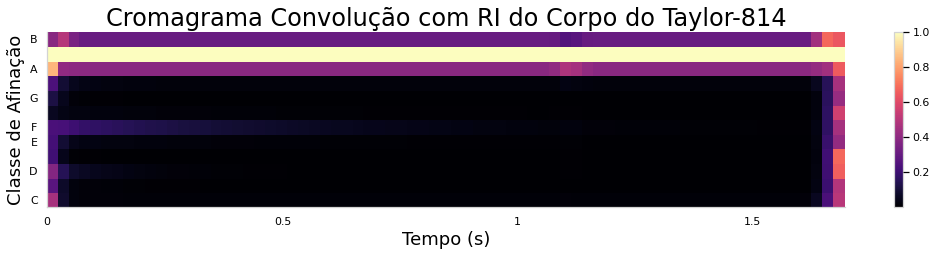

In [580]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma6, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromas6a.svg', format='svg')

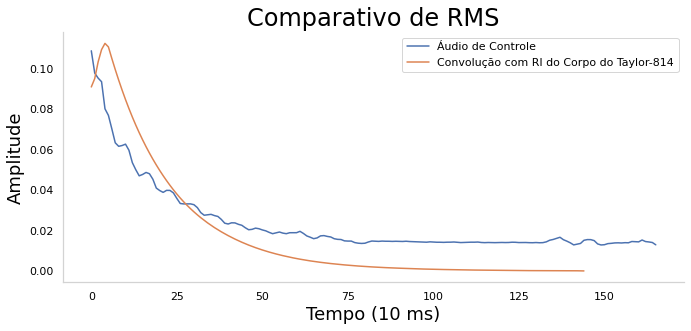

In [581]:
rms7=librosa.feature.rms(y=y7)
rms6a=librosa.feature.rms(y=s6a)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms6a.T, label="Convolução com RI do Corpo do Taylor-814")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss6a.svg', format='svg')

##Waveguide implementada por Filtros Digitais:

###Sinal de Excitação: $\delta[n]$

In [582]:
z0=np.zeros(round((duracao*fs)-len(y0)),)
x0=np.hstack((y0,z0))

###Damping Filter: $H_d(z)=\frac{B(z)}{A(z)}$

In [583]:
#Condições Iniciais para Violão
g=0.99
r0=1
r1=-0.4
a1=[r0,r1]
b1=g*sum(a1)

###Linha de Delay e Fator de estabilidade: $\Delta = \frac{\eta-1}{\eta+1}$

In [584]:
phi=0.4275 #fase do delay (aproximação)
D = math.floor(fs/f - phi) #Tamanhoda linha de delay
delta = fs/f - phi - D #fator de estabilidade
#condição para evitar instabilidade - delta=[0.1,1.1]
if delta < 0.1:
  delta = delta + 1
  D = D - 1

##Fractional Delay Filter:$H_f(z)=\frac{\eta.z^{-1}}{1+\eta.z^{-1}}$

In [585]:
eta = (1-delta) / (1+delta)
a2 = [1,eta] #denomonador filtro fracional
b2 = [eta,1] #numerador filtro fracional 

In [586]:
num=np.convolve(b1,b2)
den=np.convolve(a1,a2)

###Determinação do Filtro de String: $H_s(z)=\frac{1}{1-H_d(z).H_f(z).z^{-D}}$

In [587]:
b=den
k=D-len(den)
m=np.zeros((k,))
z=-num
a=np.hstack((b,m,z))

###Determinação de $y[n]$

In [588]:
ganhowl=3
violao = ganhowl*(scipy.signal.lfilter(b,a,x0))
violao = violao/(max(abs(violao))+.1)

In [589]:
Audio(data=violao,rate=fs)

###MIR do áudio sintetizado por waveguide

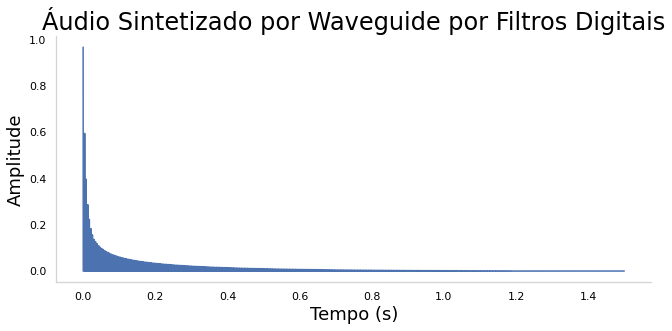

In [590]:
plt.figure(figsize=(10, 5))
t=np.arange(len(violao))/fs
plt.title('Áudio Sintetizado por Waveguide por Filtros Digitais')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,violao)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/audiofd.svg', format='svg')

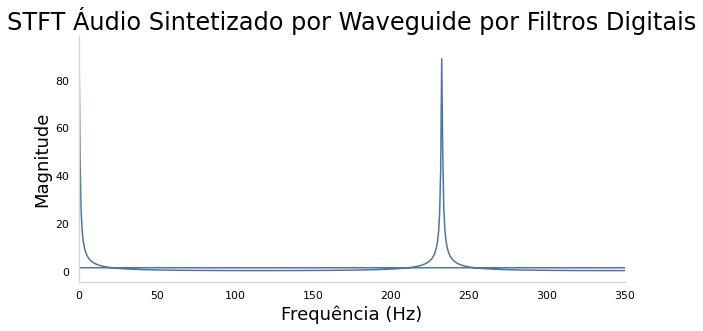

In [591]:
plt.figure(figsize=(10, 5))
Y = np.fft.fft(violao) 
freq = np.fft.fftfreq(violao.size, d=1/fs) 
plt.plot(freq, np.abs(Y)) 
plt.title('STFT Áudio Sintetizado por Waveguide por Filtros Digitais') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/stftfd.svg', format='svg')

In [592]:
Dviolao = librosa.stft(violao)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


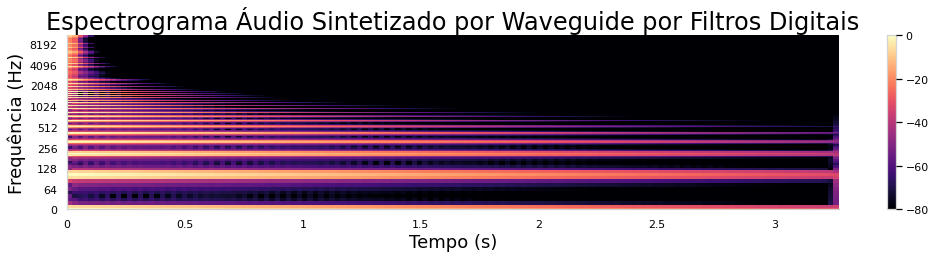

In [593]:
rpviolao = np.max(np.abs(Dviolao))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(Dviolao, ref=rpviolao), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Áudio Sintetizado por Waveguide por Filtros Digitais')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/espectrofd.svg', format='svg')

In [594]:
S1a = np.abs(librosa.stft(violao, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs)

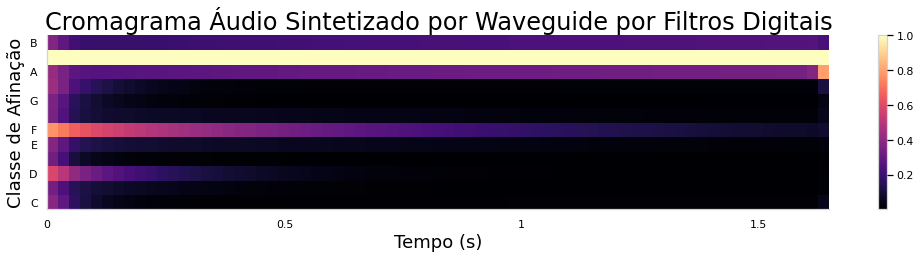

In [595]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio Sintetizado por Waveguide por Filtros Digitais')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/cromafd.svg', format='svg')

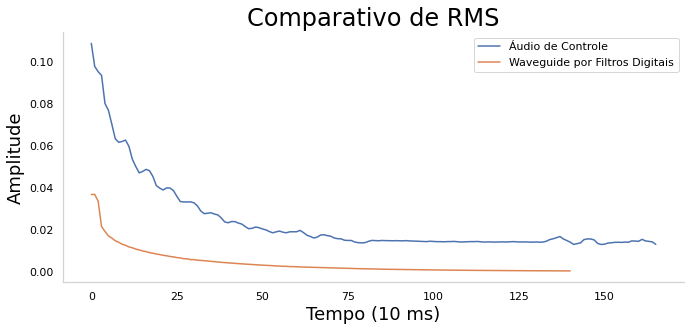

In [596]:
rms7=librosa.feature.rms(y=y7)
rmsfd=librosa.feature.rms(y=violao)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rmsfd.T, label="Waveguide por Filtros Digitais")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmss6a.svg', format='svg')

###Formalização do Sintetizador por Waveguide implementanda por Filtros Digitais

In [597]:
def waveguidefd(f,duracao,fs,excitacao,r0,r1,g,ganho):
  if ganho==0:
    ganho=1
  z0=np.zeros(round((duracao*fs)-len(excitacao)),)
  x0=np.hstack((excitacao,z0))
  a1=[r0,r1]
  b1=g*sum(a1)
  phi=0.4275 #fase do delay (aproximação)
  D = math.floor(fs/f - phi) #Tamanho da linha de delay
  delta = fs/f - phi - D #fator de estabilidade
  #condição para evitar instabilidade - delta=[0.1,1.1]
  if delta < 0.1:
    delta = delta + 1
    D = D - 1
  eta = (1-delta) / (1+delta)
  a2 = [1,eta] #denomonador filtro fracional
  b2 = [eta,1] #numerador filtro fracional
  num=np.convolve(b1,b2)
  den=np.convolve(a1,a2)
  b=den
  k=D-len(den) 
  m=np.zeros((k,))
  z=-num
  a=np.hstack((b,m,z))
  violao = ganho*(scipy.signal.lfilter(b,a,x0))
  violao = violao/(max(abs(violao))+.1)
  return np.array(violao)

##Efeito de corpo na waveguide por filtros digitais: Áudio pela convolução do sinal sintetizado com a RI de corpo 

###Convolução com Resposta ao Impulso do Corpo do Classical-AmBu2F

In [598]:
s1ax = ganhowl*(scipy.signal.oaconvolve(waveguidefd(f,duracao,fs0,y0,r0,r1,Kr,1),y1))
s1ax=s1ax/(max(abs(s1ax))+.1)

In [599]:
Audio(data=s1ax,rate=fs1)

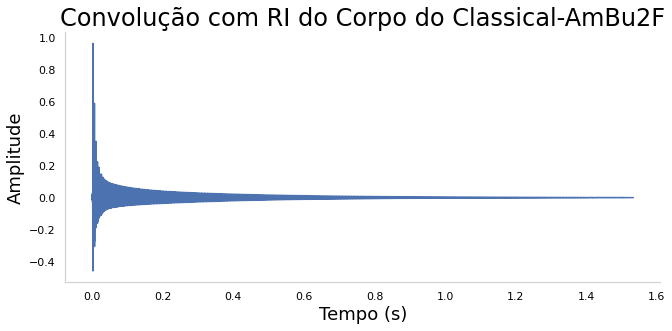

In [600]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s1ax))/fs1
plt.title('Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s1ax)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00s1ax.svg', format='svg')

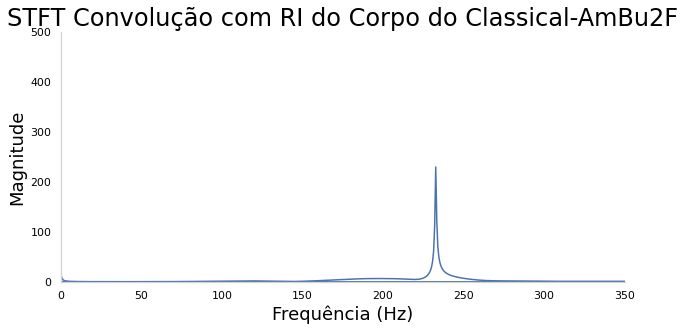

In [601]:
plt.figure(figsize=(10, 5))
Y1 = np.fft.fft(s1ax) 
freq = np.fft.fftfreq(s1ax.size, d=1/fs1) 
plt.plot(freq, np.abs(Y1)) 
plt.title('STFT Convolução com RI do Corpo do Classical-AmBu2F') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.ylim([0, 500])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00stfts1ax.svg', format='svg')

In [602]:
D1 = librosa.stft(s1ax)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


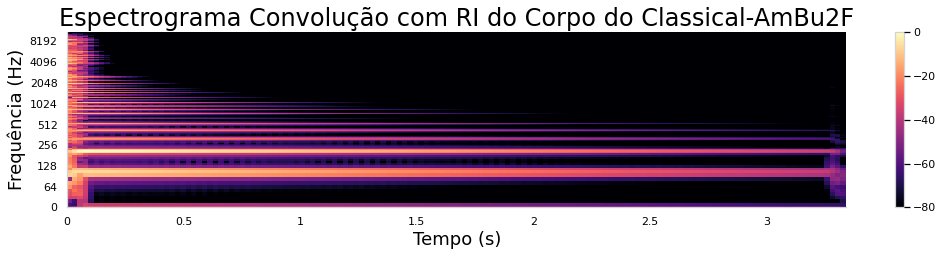

In [603]:
rp1 = np.max(np.abs(D1))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D1, ref=rp1), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00espectros1ax.svg', format='svg')

In [604]:
S1a = np.abs(librosa.stft(s1ax, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs1)

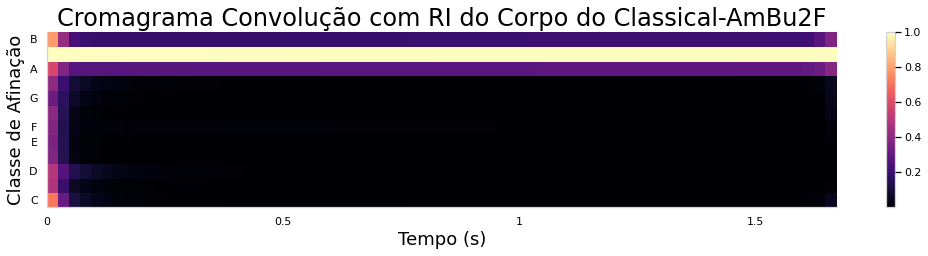

In [605]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00cromas1ax.svg', format='svg')

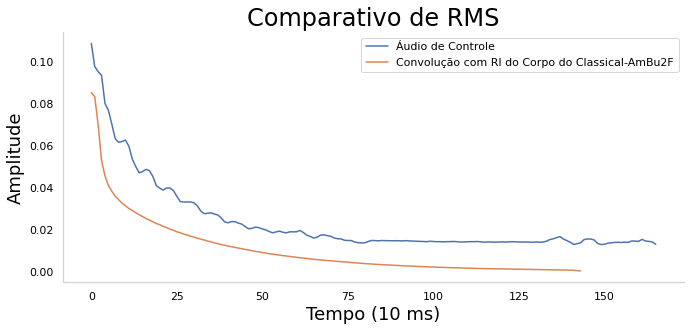

In [606]:
rms7=librosa.feature.rms(y=y7)
rms1ax=librosa.feature.rms(y=s1ax)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms1ax.T, label="Convolução com RI do Corpo do Classical-AmBu2F")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00rmss1ax.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Collings-D2H

In [607]:
s2ax= ganhowl*(scipy.signal.oaconvolve(waveguidefd(f,duracao,fs0,y0,r0,r1,Kr,1),y2))
s2ax=s2ax/(max(abs(s2ax))+.1)

In [608]:
Audio(data=s2ax,rate=fs2)

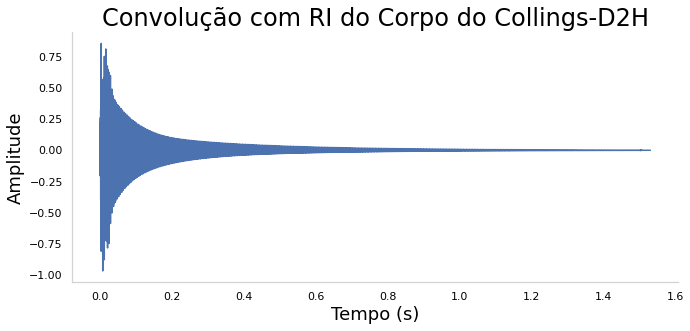

In [609]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s2ax))/fs2
plt.title('Convolução com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s2ax)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00s2ax.svg', format='svg')

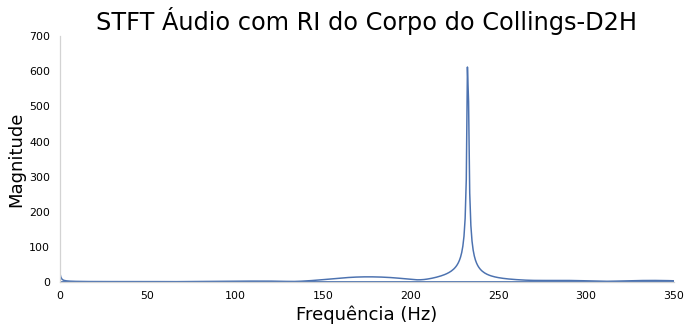

In [610]:
plt.figure(figsize=(10, 5))
Y2 = np.fft.fft(s2ax) 
freq = np.fft.fftfreq(s2ax.size, d=1/fs2) 
plt.plot(freq, np.abs(Y2)) 
plt.title('STFT Áudio com RI do Corpo do Collings-D2H') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.ylim([0, 700])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00stfts2ax.svg', format='svg')

In [611]:
D2 = librosa.stft(s2ax)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


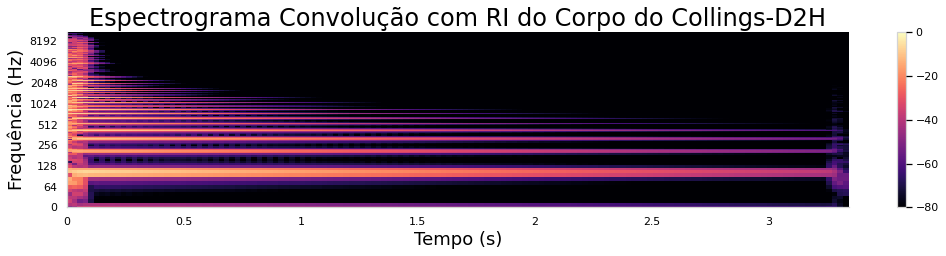

In [612]:
rp2 = np.max(np.abs(D2))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D2, ref=rp2), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00espectros2ax.svg', format='svg')

In [613]:
S2a = np.abs(librosa.stft(s2ax, n_fft=4096))**2
chroma2 = librosa.feature.chroma_stft(S=S2a, sr=fs2)

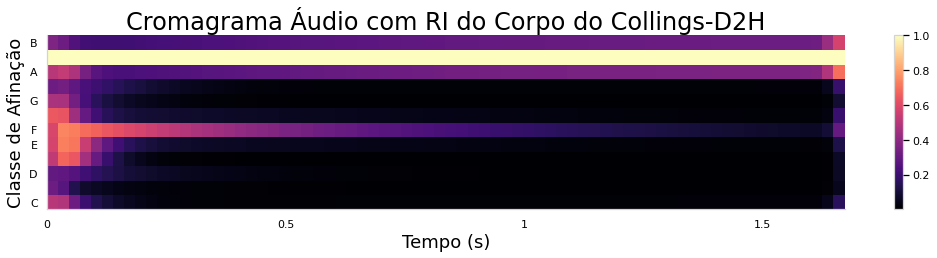

In [614]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma2, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00cromas2ax.svg', format='svg')

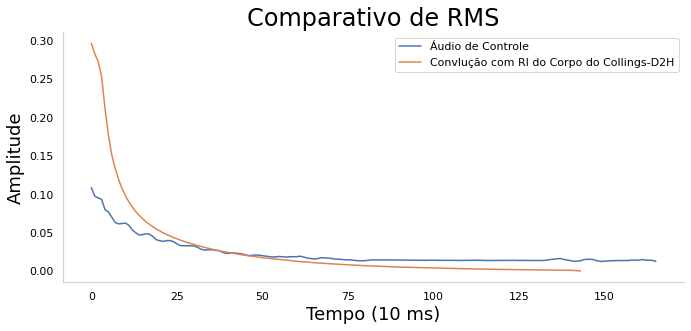

In [615]:
rms7=librosa.feature.rms(y=y7)
rms2ax=librosa.feature.rms(y=s2ax)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms2ax.T, label="Convlução com RI do Corpo do Collings-D2H")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00rmss2ax.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Gibson-J45

In [616]:
s3ax = ganhowl*(scipy.signal.oaconvolve(waveguidefd(f,duracao,fs0,y0,r0,r1,Kr,1),y3))
s3ax=s3ax/(max(abs(s3ax))+.1)

In [617]:
Audio(data=s3ax,rate=fs3)

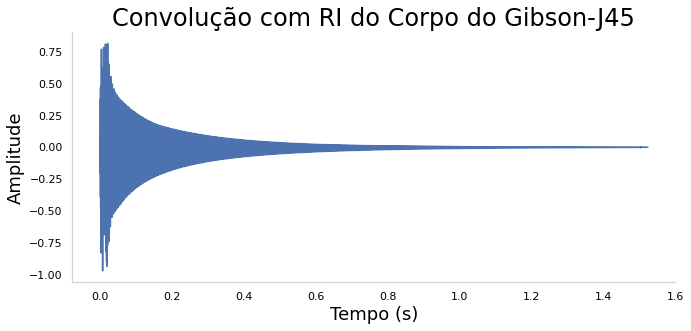

In [618]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s3ax))/fs3
plt.title('Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s3ax)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00s3ax.svg', format='svg')

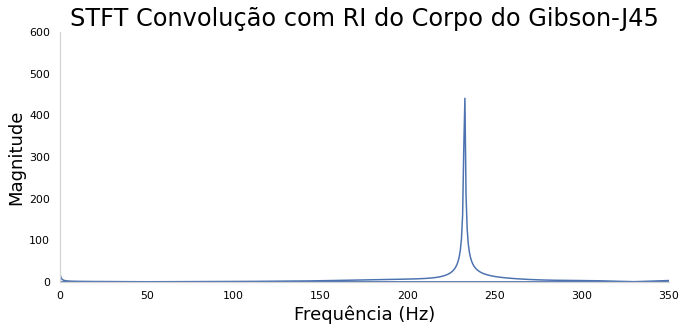

In [619]:
plt.figure(figsize=(10, 5))
Y3 = np.fft.fft(s3ax) 
freq = np.fft.fftfreq(s3ax.size, d=1/fs3) 
plt.plot(freq, np.abs(Y3)) 
plt.title('STFT Convolução com RI do Corpo do Gibson-J45') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.ylim([0, 600])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00stfts3ax.svg', format='svg')

In [620]:
D3 = librosa.stft(s3ax)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


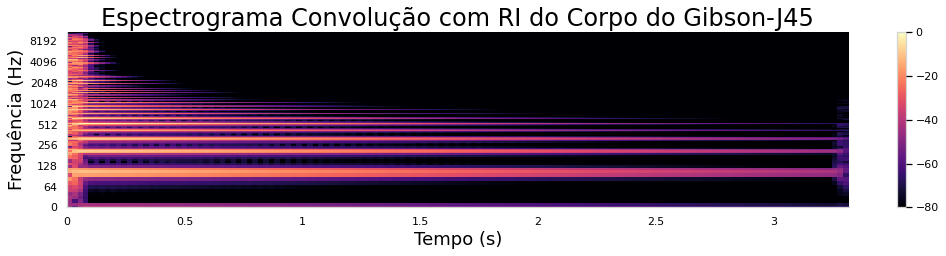

In [621]:
rp3 = np.max(np.abs(D3))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D3, ref=rp3), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00espectros3ax.svg', format='svg')

In [622]:
S3a = np.abs(librosa.stft(s3ax, n_fft=4096))**2
chroma3 = librosa.feature.chroma_stft(S=S3a, sr=fs3)

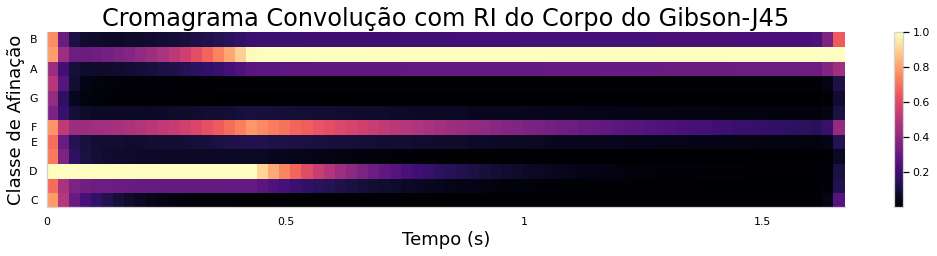

In [623]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma3, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00cromas3ax.svg', format='svg')

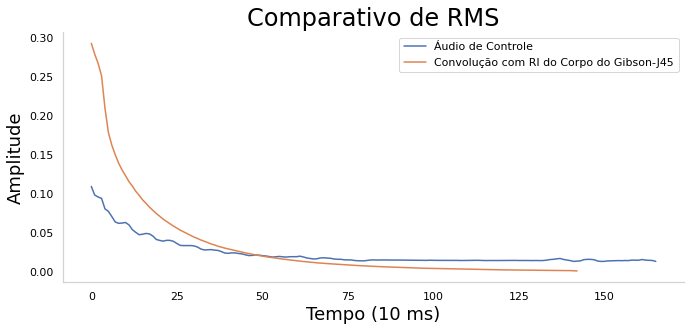

In [624]:
rms7=librosa.feature.rms(y=y7)
rms3ax=librosa.feature.rms(y=s3ax)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms3ax.T, label="Convolução com RI do Corpo do Gibson-J45")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00rmss3ax.svg', format='svg')

###Excitação com Resposta ao Impulso do Corpo do Hummingbird-Classic

In [625]:
s4ax = ganhowl*(scipy.signal.oaconvolve(waveguidefd(f,duracao,fs0,y0,r0,r1,Kr,1),y4))
s4ax=s4ax/(max(abs(s4ax))+.1)

In [626]:
Audio(data=s4ax,rate=fs4)

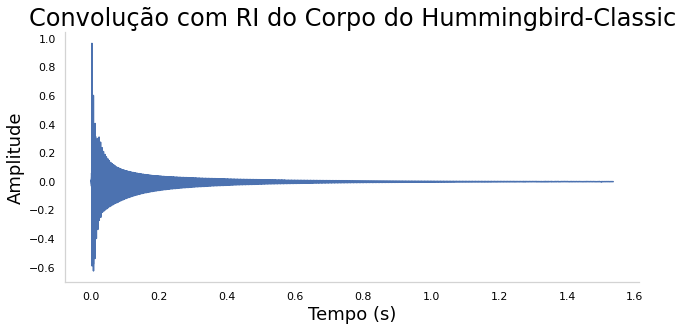

In [627]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s4ax))/fs4
plt.title('Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s4ax)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00s4ax.svg', format='svg')

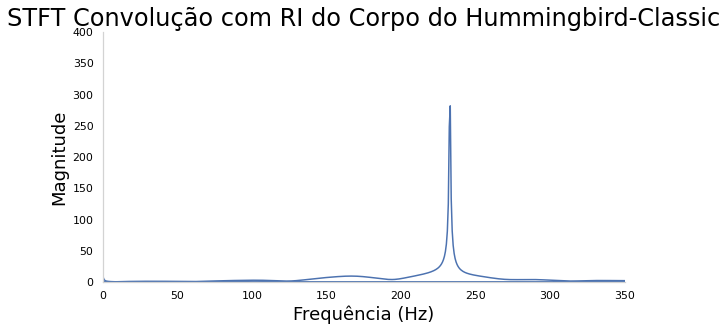

In [628]:
plt.figure(figsize=(10, 5))
Y4 = np.fft.fft(s4ax) 
freq = np.fft.fftfreq(s4ax.size, d=1/fs4) 
plt.plot(freq, np.abs(Y4)) 
plt.title('STFT Convolução com RI do Corpo do Hummingbird-Classic') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.ylim([0, 400])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00stfts4ax.svg', format='svg')

In [629]:
D4 = librosa.stft(s4ax)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


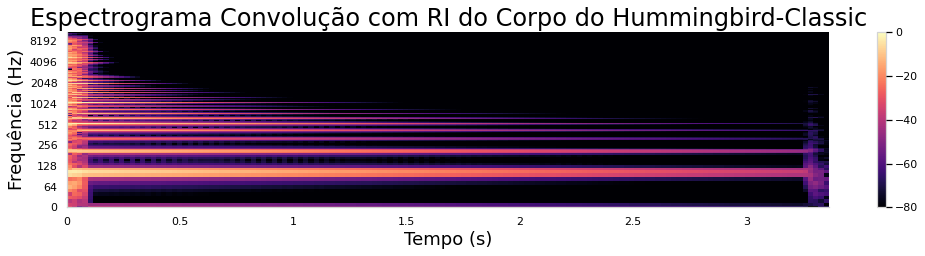

In [630]:
rp4 = np.max(np.abs(D4))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D4, ref=rp4), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00espectros4ax.svg', format='svg')

In [631]:
S4a = np.abs(librosa.stft(s4ax, n_fft=4096))**2
chroma4 = librosa.feature.chroma_stft(S=S4a, sr=fs4)

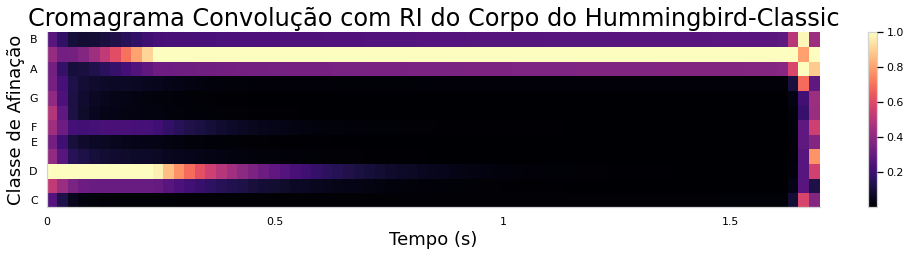

In [632]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma4, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00cromas4ax.svg', format='svg')

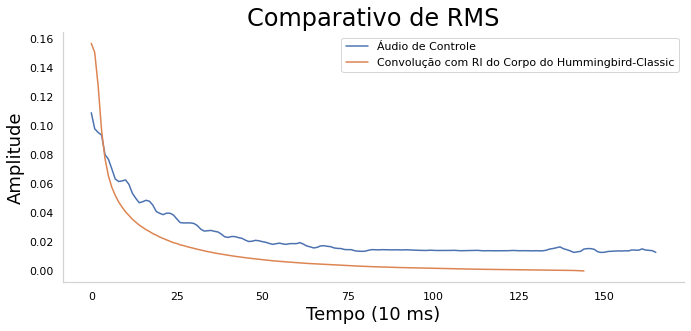

In [633]:
rms7=librosa.feature.rms(y=y7)
rms4ax=librosa.feature.rms(y=s4ax)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms4ax.T, label="Convolução com RI do Corpo do Hummingbird-Classic")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00rmss4ax.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Martin-HD28

In [634]:
s5ax = ganhowl*(scipy.signal.oaconvolve(waveguidefd(f,duracao,fs0,y0,r0,r1,Kr,1),y5))
s5ax=s5ax/(max(abs(s5ax))+.1)

In [635]:
Audio(data=s5ax,rate=fs5)

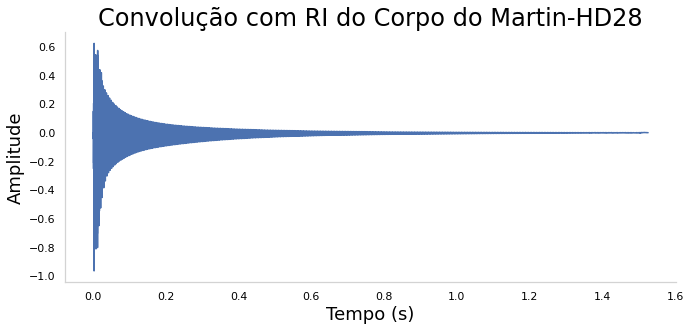

In [636]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s5ax))/fs5
plt.title('Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s5ax)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00s5ax.svg', format='svg')

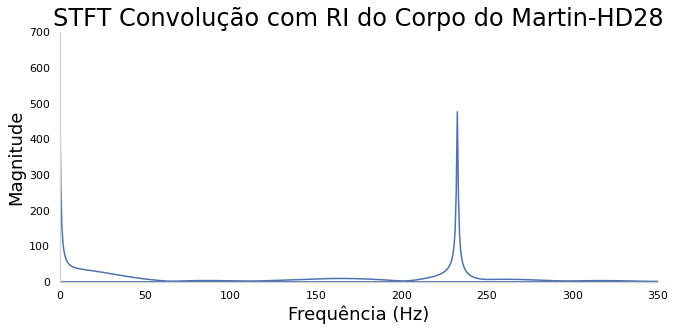

In [637]:
plt.figure(figsize=(10, 5))
Y5 = np.fft.fft(s5ax) 
freq = np.fft.fftfreq(s5ax.size, d=1/fs5) 
plt.plot(freq, np.abs(Y5)) 
plt.title('STFT Convolução com RI do Corpo do Martin-HD28') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.ylim([0, 700])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00stfts5ax.svg', format='svg')

In [638]:
D5 = librosa.stft(s5ax)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


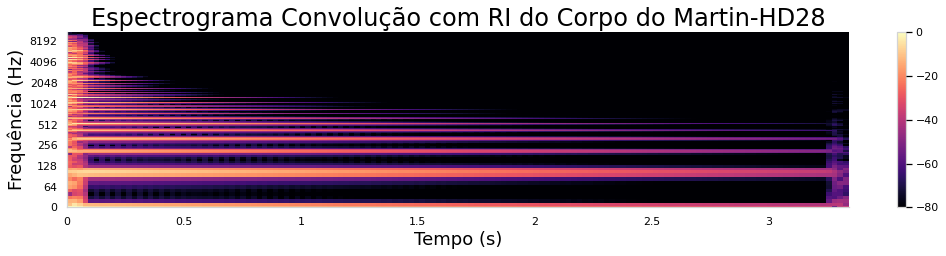

In [639]:
rp5 = np.max(np.abs(D5))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D5, ref=rp5), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00espectros5ax.svg', format='svg')

In [640]:
S5a = np.abs(librosa.stft(s5ax, n_fft=4096))**2
chroma5 = librosa.feature.chroma_stft(S=S5a, sr=fs5)

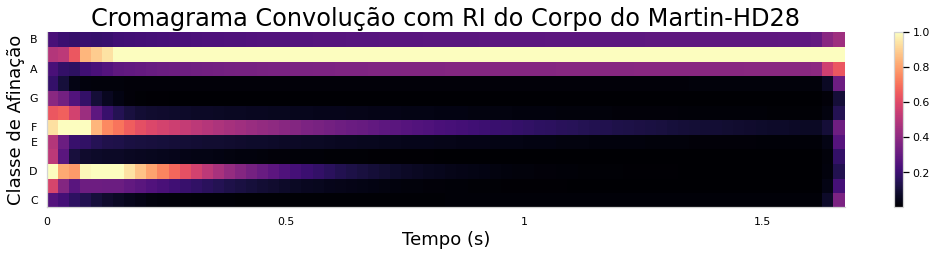

In [641]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma5, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00cromas5ax.svg', format='svg')

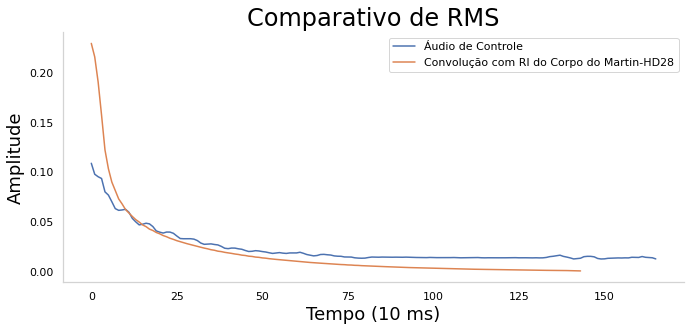

In [642]:
rms7=librosa.feature.rms(y=y7)
rms5ax=librosa.feature.rms(y=s5ax)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms5ax.T, label="Convolução com RI do Corpo do Martin-HD28")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00rmss5ax.svg', format='svg')

###Convolução com Resposta ao Impulso do Corpo do Taylor-814

In [643]:
s6ax = ganhowl*(scipy.signal.oaconvolve(waveguidefd(f,duracao,fs0,y0,r0,r1,Kr,1),y6))
s6ax=s6ax/(max(abs(s6ax))+.1)

In [644]:
Audio(data=s6ax,rate=fs6)

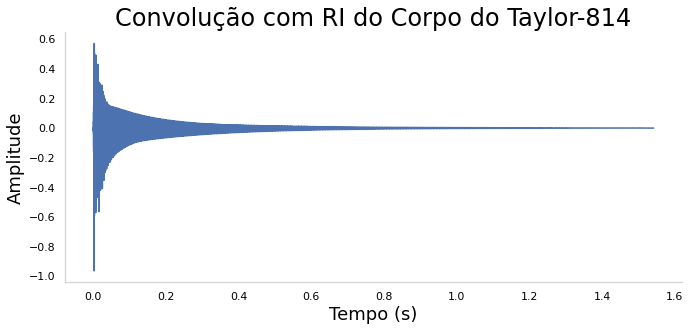

In [645]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s6ax))/fs6
plt.title('Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s6ax)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00s6ax.svg', format='svg')

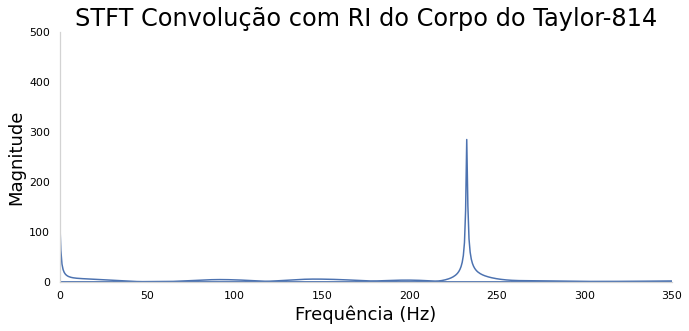

In [646]:
plt.figure(figsize=(10, 5))
Y6 = np.fft.fft(s6ax) 
freq = np.fft.fftfreq(s6ax.size, d=1/fs6) 
plt.plot(freq, np.abs(Y6)) 
plt.title('STFT Convolução com RI do Corpo do Taylor-814') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 350])
plt.ylim([0, 500])
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00stfts6ax.svg', format='svg')

In [647]:
D6 = librosa.stft(s6ax)

/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


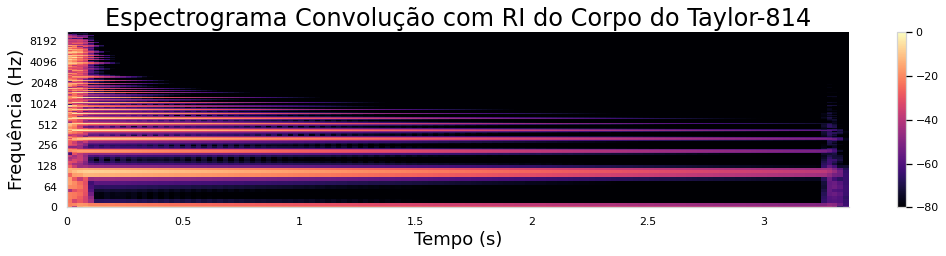

In [648]:
rp6 = np.max(np.abs(D6))

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D6, ref=rp6), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Espectrograma Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Frequência (Hz)')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00espectros6ax.svg', format='svg')

In [649]:
S6a = np.abs(librosa.stft(s6ax, n_fft=4096))**2
chroma6 = librosa.feature.chroma_stft(S=S6a, sr=fs6)

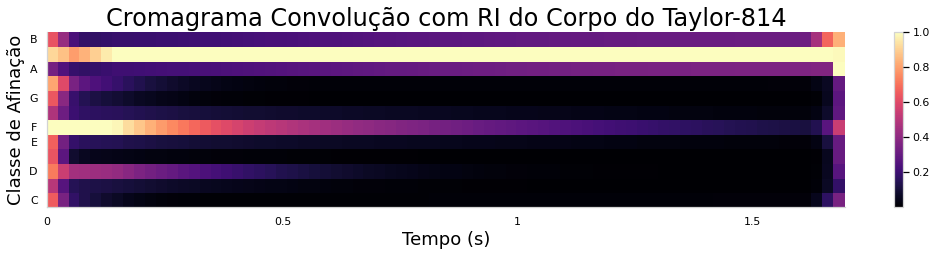

In [650]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma6, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00cromas6ax.svg', format='svg')

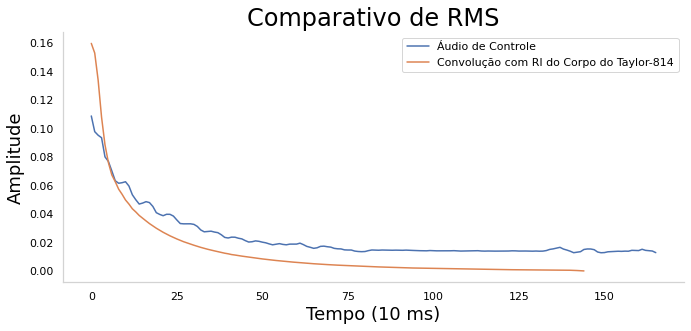

In [651]:
rms7=librosa.feature.rms(y=y7)
rms6ax=librosa.feature.rms(y=s6ax)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms6ax.T, label="Convolução com RI do Corpo do Taylor-814")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/00rmss6ax.svg', format='svg')

#Comparativo de RMS entre Metodologias e Respostas ao Impulso de Corpo

###Waveguide Clássica

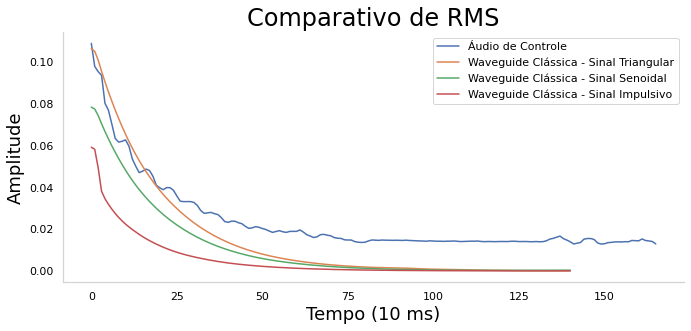

In [652]:
plt.figure(figsize=(10, 5))
rmst=librosa.feature.rms(y=triangular)
rmss=librosa.feature.rms(y=senoidal)
rmsi=librosa.feature.rms(y=impulsivo)
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rmst.T, label="Waveguide Clássica - Sinal Triangular")
plt.plot(rmss.T, label="Waveguide Clássica - Sinal Senoidal")
plt.plot(rmsi.T, label="Waveguide Clássica - Sinal Impulsivo")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rmswc.svg', format='svg')

##Resposta ao Impulso do Corpo do Classical-AmBu2F

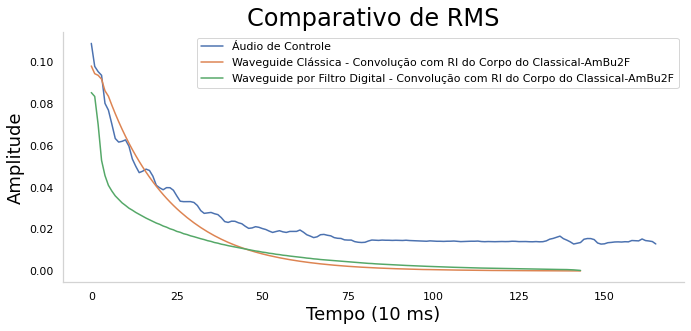

In [653]:
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms1a.T, label="Waveguide Clássica - Convolução com RI do Corpo do Classical-AmBu2F")
plt.plot(rms1ax.T, label="Waveguide por Filtro Digital - Convolução com RI do Corpo do Classical-AmBu2F")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rms01.svg', format='svg')

##Resposta ao Impulso do Corpo do Collings-D2H

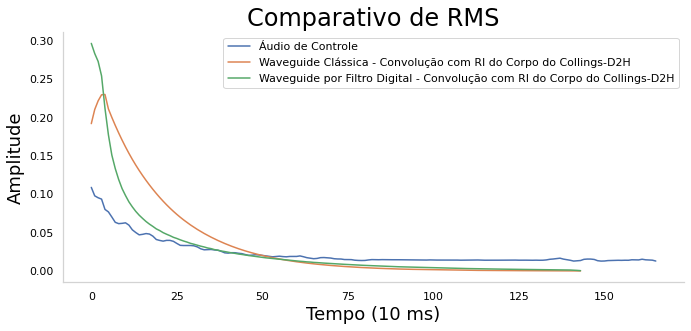

In [654]:
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms2a.T, label="Waveguide Clássica - Convolução com RI do Corpo do Collings-D2H")
plt.plot(rms2ax.T, label="Waveguide por Filtro Digital - Convolução com RI do Corpo do Collings-D2H")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rms02.svg', format='svg')

##Resposta ao Impulso do Corpo do Gibson-J45

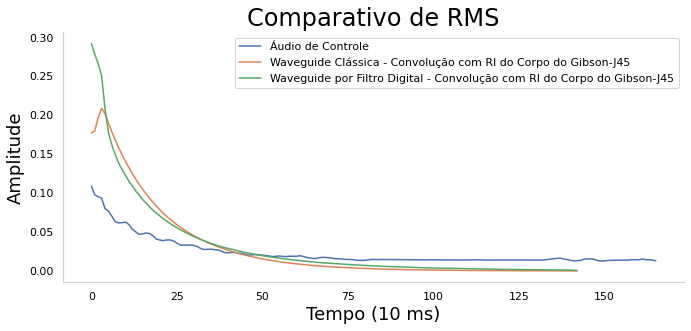

In [655]:
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms3a.T, label="Waveguide Clássica - Convolução com RI do Corpo do Gibson-J45")
plt.plot(rms3ax.T, label="Waveguide por Filtro Digital - Convolução com RI do Corpo do Gibson-J45")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rms03.svg', format='svg')

##Resposta ao Impulso do Corpo do Hummingbird-Classic

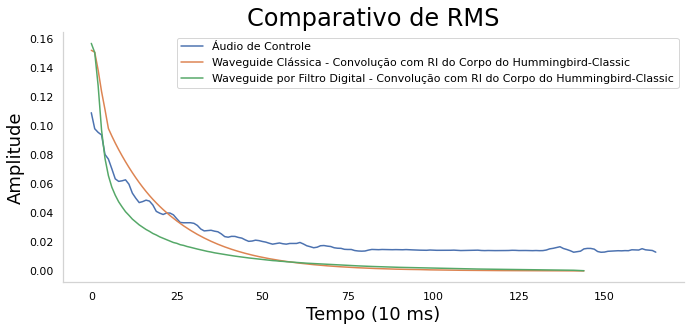

In [656]:
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms4a.T, label="Waveguide Clássica - Convolução com RI do Corpo do Hummingbird-Classic")
plt.plot(rms4ax.T, label="Waveguide por Filtro Digital - Convolução com RI do Corpo do Hummingbird-Classic")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rms04.svg', format='svg')

##Resposta ao Impulso do Corpo do Martin-HD28

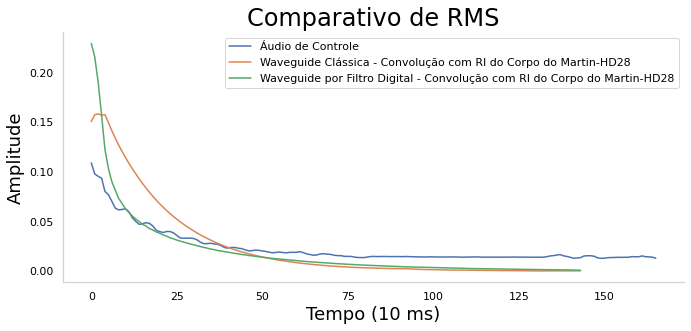

In [657]:
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms5a.T, label="Waveguide Clássica - Convolução com RI do Corpo do Martin-HD28")
plt.plot(rms5ax.T, label="Waveguide por Filtro Digital - Convolução com RI do Corpo do Martin-HD28")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rms05.svg', format='svg')

##Resposta ao Impulso do Corpo do Taylor-814


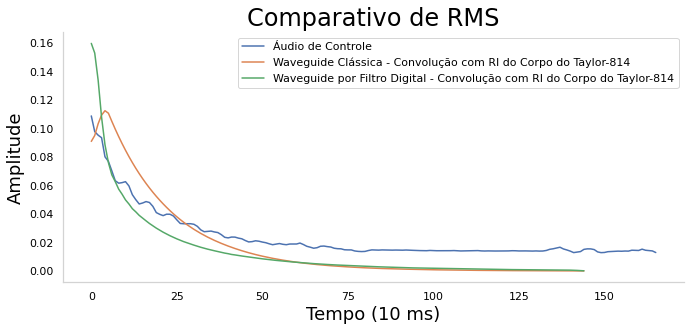

In [658]:
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms7.T,label="Áudio de Controle")
plt.plot(rms6a.T, label="Waveguide Clássica - Convolução com RI do Corpo do Taylor-814")
plt.plot(rms6ax.T, label="Waveguide por Filtro Digital - Convolução com RI do Corpo do Taylor-814")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/TFC/SVG/rms06.svg', format='svg')

#Síntese de 2 Oitavas Musicais


##Oitava Central: onde [0] = Dó, [1] = Dó#, [2] = Ré, [3] = Ré#, [4] = Mi, [5] = Fá, [6] = Fá#, [7] = Sol, [8] = Sol#, [9] = Lá, [10] = Lá#, [11] = Si, [12] = Dó.

In [659]:
freqs = np.logspace(0, 1, num=13, base=2) *263
wcg03=[]
wfg03=[]
for freq in freqs:
    sample03a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,0.3,fs,sinal01,pu,pk,Kr,1),y2))
    sample03a=sample03a/(max(abs(sample03a))+.1)
    sample03b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,0.3,fs1,y1,r0,r1,Kr,1),y1))
    wcg03.append(sample03a)
    wfg03.append(sample03b)    

In [660]:
freqs = np.logspace(0, 1, num=13, base=2) *263
wcg05=[]
wfg05=[]
for freq in freqs:
    sample05a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,0.5,fs,sinal01,pu,pk,Kr,1),y2))
    sample05a=sample05a/(max(abs(sample05a))+.1)
    sample05b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,0.5,fs1,y1,r0,r1,Kr,1),y1))
    wcg05.append(sample05a)
    wfg05.append(sample05b)

In [661]:
freqs = np.logspace(0, 1, num=13, base=2) *263
wcg07=[]
wfg07=[]
for freq in freqs:
    sample07a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,0.7,fs,sinal01,pu,pk,Kr,1),y2))
    sample07a=sample07a/(max(abs(sample07a))+.1)
    sample07b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,0.7,fs1,y1,r0,r1,Kr,1),y1))
    wcg07.append(sample07a)
    wfg07.append(sample07b)

In [662]:
freqs = np.logspace(0, 1, num=13, base=2) *263
wcg10=[]
wfg10=[]
for freq in freqs:
    sample10a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,1,fs,sinal01,pu,pk,Kr,1),y2))
    sample10a=sample10a/(max(abs(sample10a))+.1)
    sample10b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,1,fs1,y1,r0,r1,Kr,1),y1))
    wcg10.append(sample10a)
    wfg10.append(sample10b)

In [663]:
freqs = np.logspace(0, 1, num=13, base=2) *263
wcg15=[]
wfg15=[]
for freq in freqs:
    sample15a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,1.5,fs,sinal01,pu,pk,Kr,1),y2))
    sample15a=sample15a/(max(abs(sample15a))+.1)
    sample15b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,1.5,fs1,y1,r0,r1,Kr,1),y1))
    wcg15.append(sample15a)
    wfg15.append(sample15b)

##Oitava Acima da Central: onde [0] = Dó, [1] = Dó#, [2] = Ré, [3] = Ré#, [4] = Mi, [5] = Fá, [6] = Fá#, [7] = Sol, [8] = Sol#, [9] = Lá, [10] = Lá#, [11] = Si, [12] = Dó.

In [664]:
freqs = np.logspace(0, 1, num=13, base=2) *526
wcf03=[]
wff03=[]
for freq in freqs:
    sample03a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,0.3,fs,sinal01,pu,pk,Kr,1),y2))
    sample03a=sample03a/(max(abs(sample03a))+.1)
    sample03b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,0.3,fs1,y1,r0,r1,Kr,1),y1))
    wcf03.append(sample03a)
    wff03.append(sample03b)    

In [665]:
freqs = np.logspace(0, 1, num=13, base=2) *526
wcf05=[]
wff05=[]
for freq in freqs:
    sample05a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,0.5,fs,sinal01,pu,pk,Kr,1),y2))
    sample05a=sample05a/(max(abs(sample05a))+.1)
    sample05b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,0.5,fs1,y1,r0,r1,Kr,1),y1))
    wcf05.append(sample05a)
    wff05.append(sample05b)

In [666]:
freqs = np.logspace(0, 1, num=13, base=2) *526
wcf07=[]
wff07=[]
for freq in freqs:
    sample07a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,0.7,fs,sinal01,pu,pk,Kr,1),y2))
    sample07a=sample07a/(max(abs(sample07a))+.1)
    sample07b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,0.7,fs1,y1,r0,r1,Kr,1),y1))
    wcf07.append(sample07a)
    wff07.append(sample07b)

In [667]:
freqs = np.logspace(0, 1, num=13, base=2) *526
wcf10=[]
wff10=[]
for freq in freqs:
    sample10a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,1,fs,sinal01,pu,pk,Kr,1),y2))
    sample10a=sample10a/(max(abs(sample10a))+.1)
    sample10b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,1,fs1,y1,r0,r1,Kr,1),y1))
    wcf10.append(sample10a)
    wff10.append(sample10b)

In [668]:
freqs = np.logspace(0, 1, num=13, base=2) *526
wcf15=[]
wff15=[]
for freq in freqs:
    sample15a=ganhoc*(scipy.signal.oaconvolve(waveguide(freq,1.5,fs,sinal01,pu,pk,Kr,1),y2))
    sample15a=sample15a/(max(abs(sample15a))+.1)
    sample15b=ganhowl*(scipy.signal.oaconvolve(waveguidefd(freq,1.5,fs1,y1,r0,r1,Kr,1),y1))
    wcf15.append(sample15a)
    wff15.append(sample15b)

#Composições musicais feitas pelas notas sintetizadas:

##Trecho de Jesus, a alegria dos Homens - Bach

###Waveguide Clássica

In [669]:
musica01=np.hstack((
wcg03[7], wcg03[9], wcg03[11], wcf03[2], wcf03[0], wcf03[0], wcf03[4], wcf03[2],
wcf03[2], wcf03[7], wcf03[6], wcf03[7], wcf03[2], wcg03[11], wcg03[7], wcg03[9], wcg03[11],
wcf03[0], wcf03[2], wcf03[4], wcf03[2], wcf03[0], wcg03[11], wcg03[9], wcg03[11], wcg03[7],
wcg03[6], wcg03[7], wcg03[9], wcg03[2], wcg03[6], wcg03[9], wcf03[0], wcg03[11], wcg03[9],
wcg03[11], wcg03[7], wcg03[9], wcg03[11], wcf03[2], wcf03[0], wcf03[0], wcf03[4], wcf03[2],
wcf03[2], wcf03[7], wcf03[6], wcf03[7], wcf03[2], wcg03[11], wcg03[7], wcg03[9], wcg03[11],
wcg03[4],wcf03[2], wcf03[0], wcg03[11], wcg03[9], wcg03[7], wcg03[2], wcg03[7], wcg03[6],wcg05[7]   
))
display(Audio(musica01,rate=fs))

###Waveguide por Filtros Digitais

In [670]:
musica01a=np.hstack((
wfg03[7], wfg03[9], wfg03[11], wff03[2], wff03[0], wff03[0], wff03[4], wff03[2],
wff03[2], wff03[7], wff03[6], wff03[7], wff03[2], wfg03[11], wfg03[7], wfg03[9], wfg03[11],
wff03[0], wff03[2], wff03[4], wff03[2], wff03[0], wfg03[11], wfg03[9], wfg03[11], wfg03[7],
wfg03[6], wfg03[7], wfg03[9], wfg03[2], wfg03[6], wfg03[9], wff03[0], wfg03[11], wfg03[9],
wfg03[11], wfg03[7], wfg03[9], wfg03[11], wff03[2], wff03[0], wff03[0], wff03[4], wff03[2],
wff03[2], wff03[7], wff03[6], wff03[7], wff03[2], wfg03[11], wfg03[7], wfg03[9], wfg03[11],
wfg03[4],wff03[2], wff03[0], wfg03[11], wfg03[9], wfg03[7], wfg03[2], wfg03[7], wfg03[6],wfg05[7]   
))
display(Audio(musica01a,rate=fs))

##Trecho Abertura GOT

###Waveguide Clássica

In [671]:
musica02=np.hstack((
wcg15[9], wcg15[2], wcg03[5], wcg03[7], wcg07[9], wcg07[2], wcg03[5], wcg03[7], wcg15[4],
wcg15[7], wcg15[0], wcg03[5], wcg03[4], wcg07[7], wcg07[0], wcg03[5], wcg03[4], wcg15[2],
wcg15[9], wcg15[2], wcg03[5], wcg03[7], wcg07[9], wcg07[2], wcg03[5], wcg03[7], wcg15[4],
wcg15[7], wcg15[0], wcg07[4], wcg07[5], wcg07[4], wcg07[0], wcg07[2],
       ))
display(Audio(musica02,rate=fs))

###Waveguide por Filtros Digitais

In [672]:
musica02a=np.hstack((
wfg15[9], wfg15[2], wfg03[5], wfg03[7], wfg07[9], wfg07[2], wfg03[5], wfg03[7], wfg15[4],
wfg15[7], wfg15[0], wfg03[5], wfg03[4], wfg07[7], wfg07[0], wfg03[5], wfg03[4], wfg15[2],
wfg15[9], wfg15[2], wfg03[5], wfg03[7], wfg07[9], wfg07[2], wfg03[5], wfg03[7], wfg15[4],
wfg15[7], wfg15[0], wfg07[4], wfg07[5], wfg07[4], wfg07[0], wfg07[2],
       ))
display(Audio(musica02a,rate=fs))